# A Predictive Analysis on Credit Card Customer Churn Using Maching Learning and Deep Learning Techniques

The aim of this study is to evaluate which Machine Learning, Deep Learning or Ensemble techniques is most efficient at predicting credit card customer churn for banks. Widely varying methodologies and experimental setups have been carried to compare various techniques for customer churn, however Ensemble techniques are not experimented in many studies within this domain. In this study, Ensemble techniques such as voting and stacking is applied to combine several base model in order to produce an optimal model.

The study aims to help banks mitigate the cost associated with losing credit card customers. By predicting if a customer intends on leaving, the bank can proactively react in time and convince the customer to stay

The dataset is used in this analysis is available on kaggle at: https://www.kaggle.com/datasets/sakshigoyal7/credit-card-customers

### Table of Content
1. [Exploratory Data Analysis](#1.-Exploratory-Data-Analysis)
2. [Data Preparation](#2.-Data-Preparation) <br>
    2.1 [Data Preprocessing](#2.1-Data-Preprocessing) <br>
    2.2 [Feature Selection](#2.2-Feature-Selection)
3. [Artificial Neural Network Epoch Selection](#3.-Artificial-Neural-Network-Epoch-Selection)
4. [Cross Validation using Machine Learning and Deep Learning models](#4.-Cross-Validation-using-Machine-Learning-and-Deep-Learning-models)
5. [SMOTE Balancing Technique](#5.-SMOTE-Balancing-Technique) <br>
    5.1 [Modelling using Random Forest, SVM, KNN, ANN, Logistic Regression and Ensembles (Stacking & Voting)](#5.1-Modelling-using-Random-Forest,-SVM,-KNN,-ANN,-Logistic-Regression-and-Ensembles-(Stacking-&-Voting)) <br>
    5.2 [Results](#5.2-Results) <br>
    5.3 [Feature Importance](#5.3-Feature-Importance) <br>
6. [Random Sampling Balancing Technique](#6.-Random-Sampling-Balancing-Technique) <br>
    6.1 [Modelling using Random Forest, SVM, KNN, ANN, Logistic Regression and Ensembles (Stacking & Voting)](#6.1-Modelling-using-Random-Forest,-SVM,-KNN,-ANN,-Logistic-Regression-and-Ensembles-(Stacking-&-Voting)) <br>
    6.2 [Results](#6.2-Results) <br>
    6.3 [Feature Importance](#6.3-Feature-Importance) <br>
7. [Conclusion](#7.-Conclusion)
 

### Import Libraries

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from matplotlib import pyplot
from numpy import where
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import  recall_score, precision_score, accuracy_score, f1_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.linear_model import Lasso
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix


from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from os import path
from PIL import Image

%matplotlib inline

# 1. Exploratory Data Analysis

An Exploratory Data Analysis is conducted to gain an depth understanding of the data

In [2]:
Churn_Dataset = pd.read_csv("BankChurners.csv")
Churn_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

#### The last 2 columns are not required for the analysis and were advised to be dropped by the data provider. Client number as well

In [3]:
Churn_Dataset = Churn_Dataset.iloc[:, 1:21]
Churn_Dataset.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


#### The columns are renamed for better usability

In [4]:
Churn_Dataset.columns = ['attrition_flag', 'customer_age', 'gender', 'dependent_count',
                         'education_level', 'marital_status', 'income_category', 'card_category',
                         'months_on_book', 'total_relationship_count', 'months_inactive_12_month',
                         'contacts_count_12_month', 'credit_limit', 'total_revolving_bal',
                         'avg_open_to_buy', 'total_amt_change_q4_q1', 'total_trans_amt',
                         'total_trans_count', 'total_count_change_q4_q1', 'avg_utilization_ratio']

#### Checking for null and na values
We find that there are no null and na values in the dataset

In [169]:
Churn_Dataset.isnull().sum()

attrition_flag              0
customer_age                0
gender                      0
dependent_count             0
education_level             0
marital_status              0
income_category             0
card_category               0
months_on_book              0
total_relationship_count    0
months_inactive_12_month    0
contacts_count_12_month     0
credit_limit                0
total_revolving_bal         0
avg_open_to_buy             0
total_amt_change_q4_q1      0
total_trans_amt             0
total_trans_count           0
total_count_change_q4_q1    0
avg_utilization_ratio       0
dtype: int64

In [170]:
Churn_Dataset.isna().sum()

attrition_flag              0
customer_age                0
gender                      0
dependent_count             0
education_level             0
marital_status              0
income_category             0
card_category               0
months_on_book              0
total_relationship_count    0
months_inactive_12_month    0
contacts_count_12_month     0
credit_limit                0
total_revolving_bal         0
avg_open_to_buy             0
total_amt_change_q4_q1      0
total_trans_amt             0
total_trans_count           0
total_count_change_q4_q1    0
avg_utilization_ratio       0
dtype: int64

In [8]:
Churn_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   attrition_flag            10127 non-null  object 
 1   customer_age              10127 non-null  int64  
 2   gender                    10127 non-null  object 
 3   dependent_count           10127 non-null  int64  
 4   education_level           10127 non-null  object 
 5   marital_status            10127 non-null  object 
 6   income_category           10127 non-null  object 
 7   card_category             10127 non-null  object 
 8   months_on_book            10127 non-null  int64  
 9   total_relationship_count  10127 non-null  int64  
 10  months_inactive_12_month  10127 non-null  int64  
 11  contacts_count_12_month   10127 non-null  int64  
 12  credit_limit              10127 non-null  float64
 13  total_revolving_bal       10127 non-null  int64  
 14  avg_op

In [9]:
Churn_Dataset.describe().apply(lambda s: s.apply('{0:.2f}'.format))

,customer_age,dependent_count,months_on_book,total_relationship_count,months_inactive_12_month,contacts_count_12_month,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_change_q4_q1,total_trans_amt,total_trans_count,total_count_change_q4_q1,avg_utilization_ratio
count,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00
mean,46.33,2.35,35.93,3.81,2.34,2.46,8631.95,1162.81,7469.14,0.76,4404.09,64.86,0.71,0.27
std,8.02,1.30,7.99,1.55,1.01,1.11,9088.78,814.99,9090.69,0.22,3397.13,23.47,0.24,0.28
min,26.00,0.00,13.00,1.00,0.00,0.00,1438.30,0.00,3.00,0.00,510.00,10.00,0.00,0.00
25%,41.00,1.00,31.00,3.00,2.00,2.00,2555.00,359.00,1324.50,0.63,2155.50,45.00,0.58,0.02
50%,46.00,2.00,36.00,4.00,2.00,2.00,4549.00,1276.00,3474.00,0.74,3899.00,67.00,0.70,0.18
75%,52.00,3.00,40.00,5.00,3.00,3.00,11067.50,1784.00,9859.00,0.86,4741.00,81.00,0.82,0.50
max,73.00,5.00,56.00,6.00,6.00,6.00,34516.00,2517.00,34516.00,3.40,18484.00,139.00,3.71,1.00


#### The features are split into numerical and categorical to explore both groups

In [5]:
numerical = ['customer_age', 'dependent_count', 'months_on_book', 
             'total_relationship_count', 'months_inactive_12_month',
             'contacts_count_12_month', 'credit_limit', 'total_revolving_bal',
             'avg_open_to_buy', 'total_amt_change_q4_q1', 'total_trans_amt',
             'total_trans_count', 'total_count_change_q4_q1', 'avg_utilization_ratio']

categorical = ['attrition_flag', 'gender','education_level', 
               'marital_status', 'income_category', 'card_category']

### Analysis on Numerical Features
We will take a look at </br>
1. The distibution of the numerical features using histograms
2. The correlation between the numerical features using a heatmap
3. Histogram and box plots to show differences in the class distribution <br/>


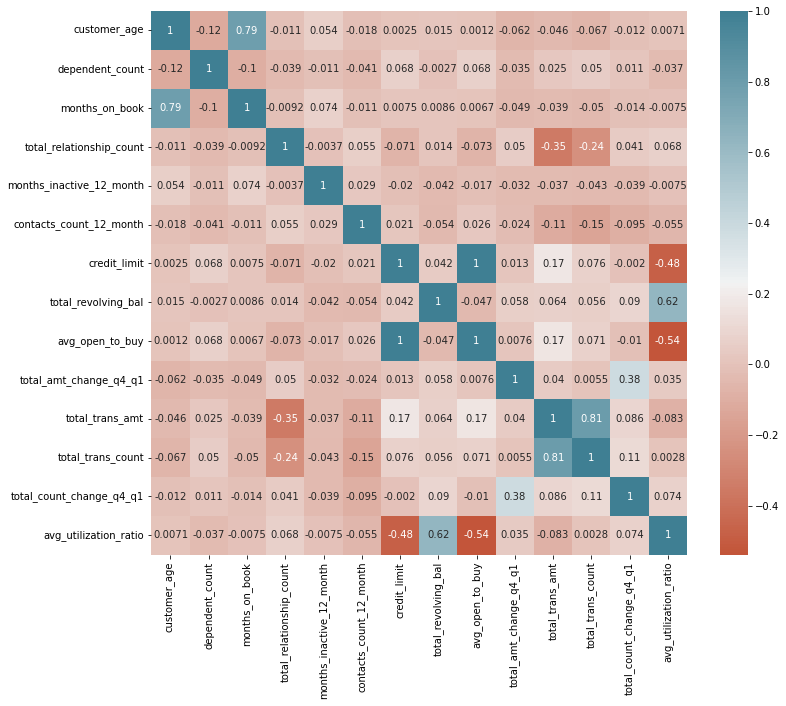

In [172]:
plt.figure(figsize = (12,10))
sns.heatmap(Churn_Dataset.corr(),cmap=sns.diverging_palette(20, 220, n=200),annot=True)
plt.show()

#### The below heatmap highlights only the correlations greater than 0.4

We see that the below features have high positive correlation
- Months on the book and customer age
- Total revolving balance and average utilization ratio
- Total count of transaction and total transaction amount
- Average open to buy and credit limit are perfect positive correlation

There is a negative correlation between average utilization ration and average open to buy

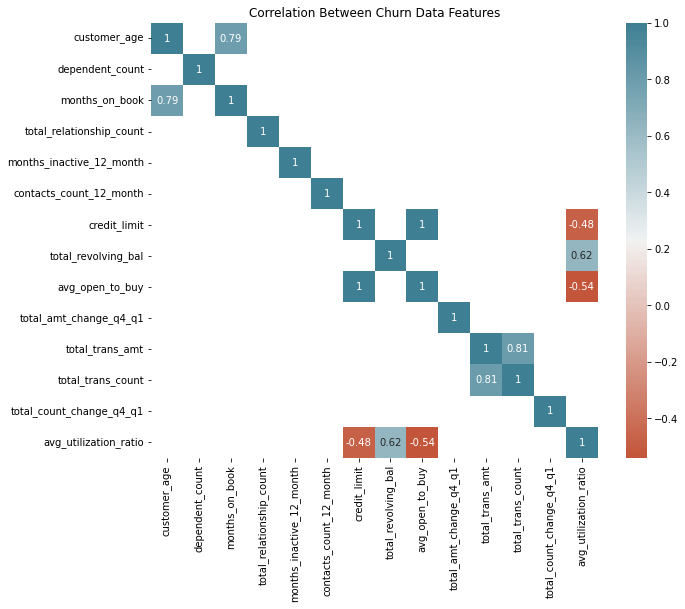

In [173]:
corr = Churn_Dataset.loc[:,numerical].corr()
kot = corr[(corr>= 0.4) | (corr <= -0.4)]
plt.figure(figsize = (10,8))   
dataplot=sns.heatmap(kot,cmap=sns.diverging_palette(20, 220, n=200), annot=True)
plt.title('Correlation Between Churn Data Features')
plt.show()

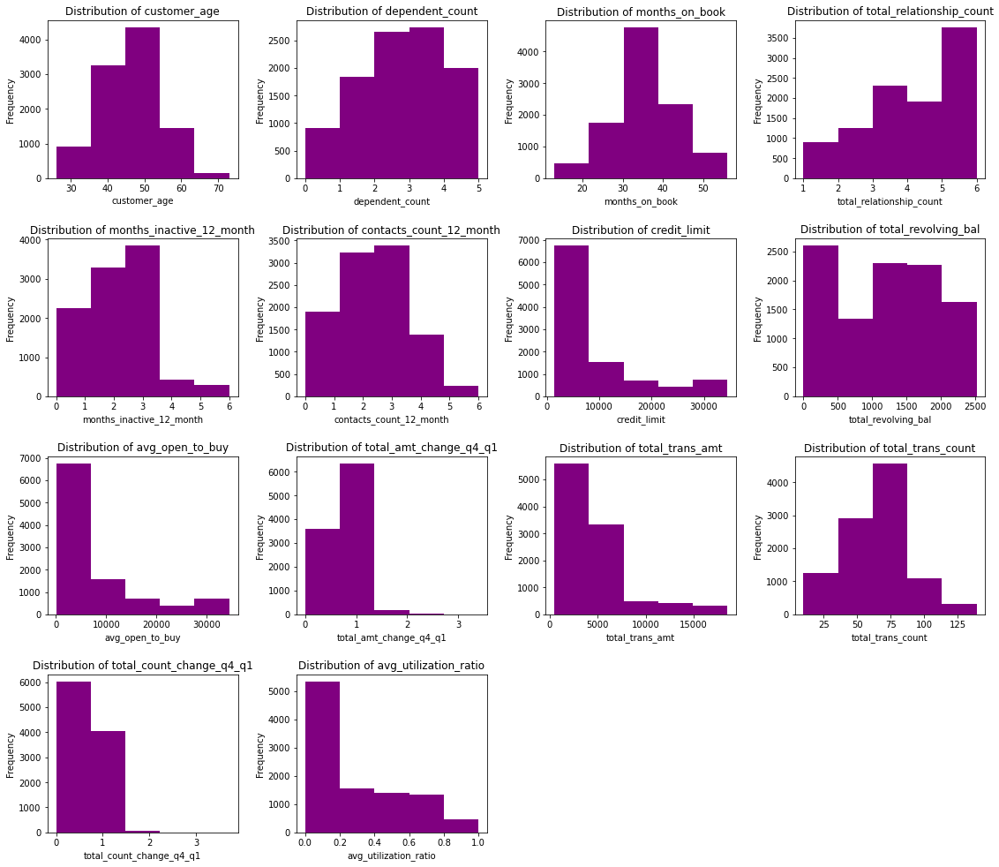

In [13]:
features = list(Churn_Dataset.columns)

fig, axs = plt.subplots(4,4, figsize=(16,14))

idx =0 

for i in range(4):
    for j in range(4):
        axs[i,j].hist(Churn_Dataset[numerical[idx]],bins=5,color='purple')
        axs[i,j].set(xlabel=numerical[idx])
        axs[i,j].set(ylabel='Frequency')
        axs[i,j].set_title("Distribution of " + str(numerical[idx]))
        idx +=1
        
        if idx == len(numerical):
                break;
            
axs[3][2].set_axis_off()
axs[3][3].set_axis_off()

fig.tight_layout(pad=2.0)
#plt.savefig("distribution.jpg",transparent = False)
plt.show()   


In [6]:
fig = px.histogram(Churn_Dataset, 
                   x="customer_age", 
                   color="attrition_flag",
                   title='Age of Customers')
fig.show()

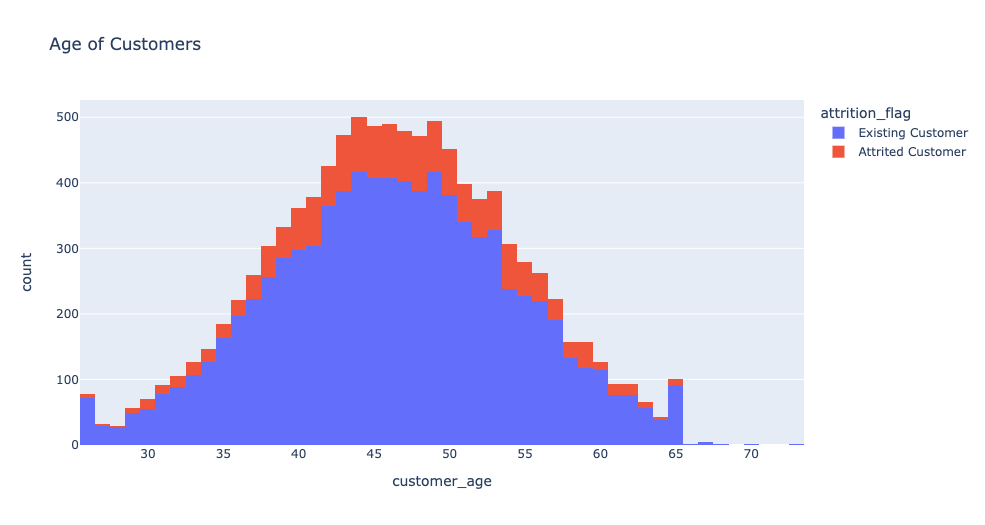

In [7]:
fig = px.histogram(Churn_Dataset, 
                   x="total_trans_count", 
                   color="attrition_flag",
                   title='Total number of Transations')
fig.show()

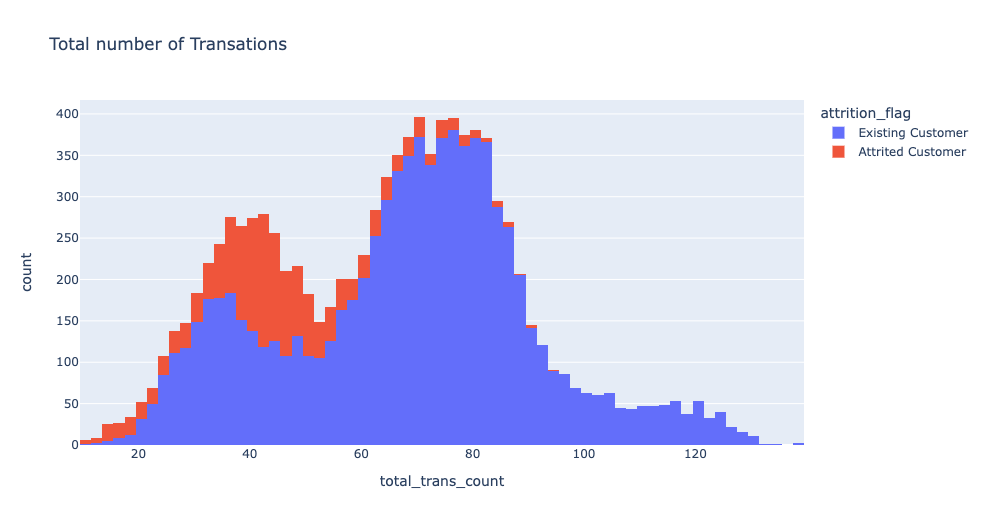

In [12]:
fig = px.histogram(Churn_Dataset, 
                   x="credit_limit", 
                   color="attrition_flag",
                   title='The credit limit of the customers')
fig.show()


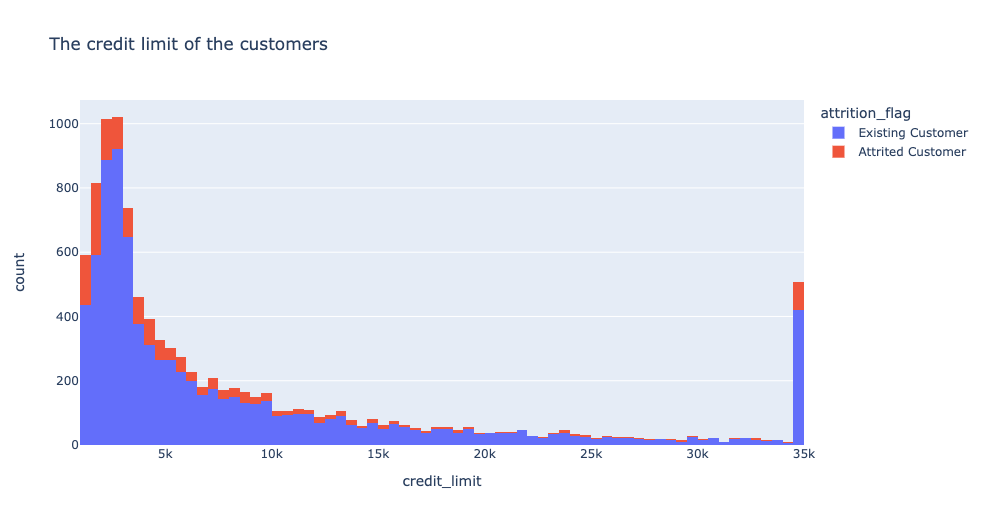

In [9]:
fig = px.histogram(Churn_Dataset, 
                   x="months_inactive_12_month", 
                   color="attrition_flag",
                   title='Total number of months inactive in the last 12 months')
fig.show()

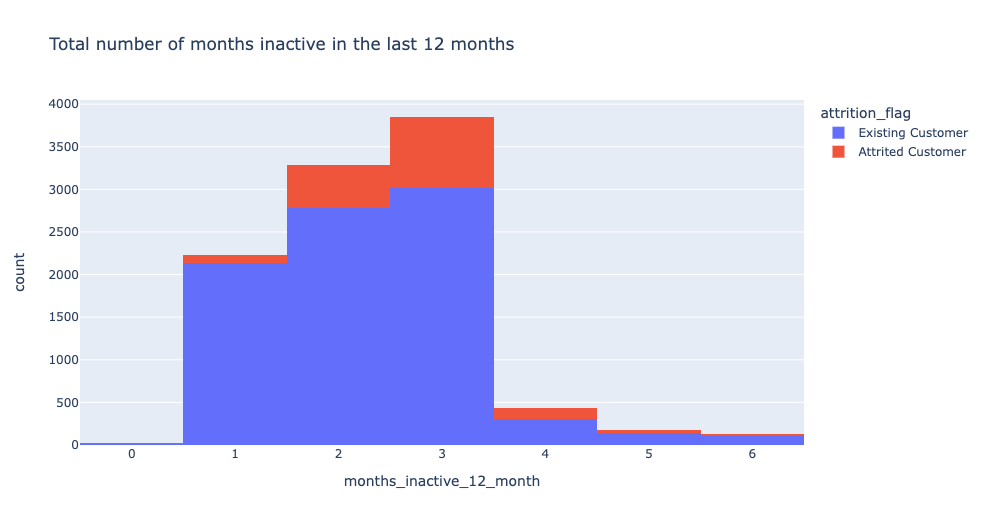

In [10]:
fig = px.histogram(Churn_Dataset, 
                   x="total_trans_amt", 
                   color="attrition_flag",
                   title='Total amount of transactions made in the last year')
fig.show()

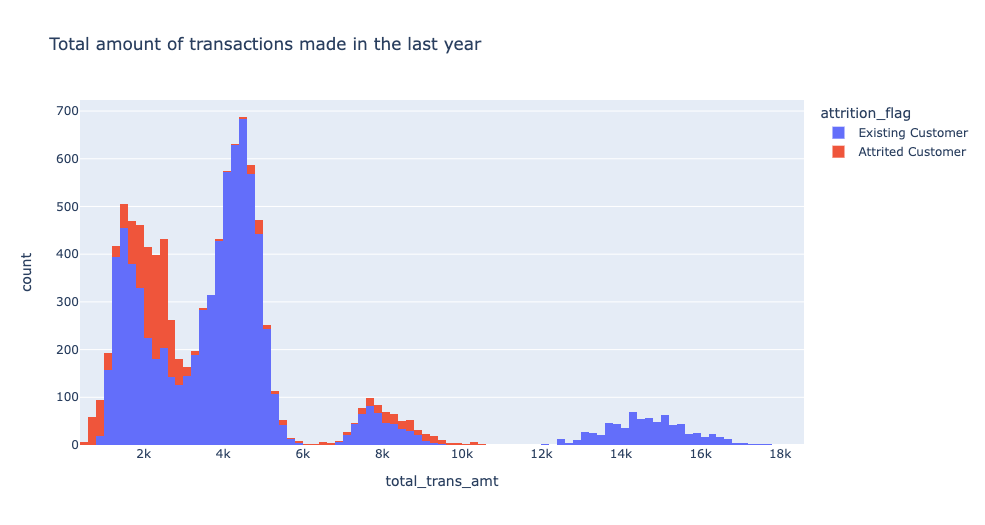

In [11]:
fig = px.histogram(Churn_Dataset, 
                   x="avg_utilization_ratio", 
                   color="attrition_flag",
                   title='Total number of months on the book')
fig.show()


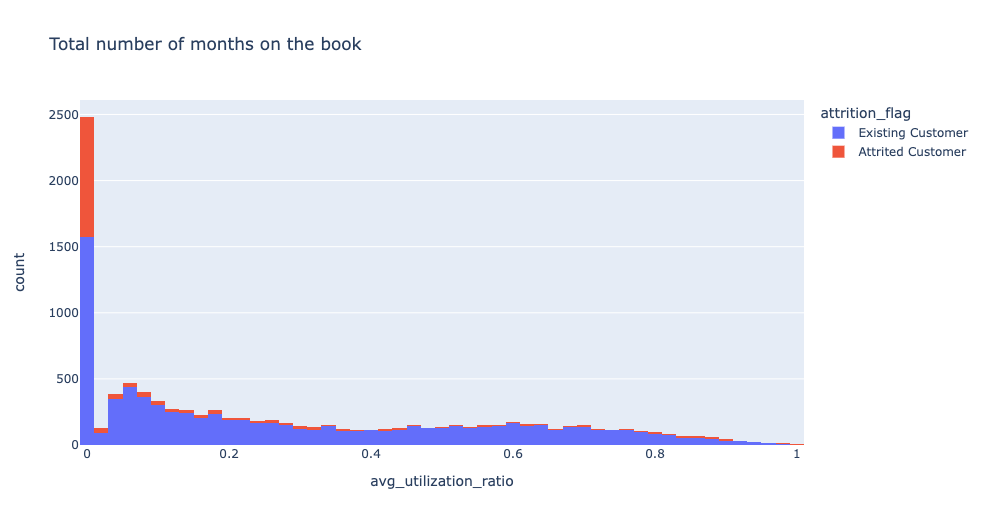

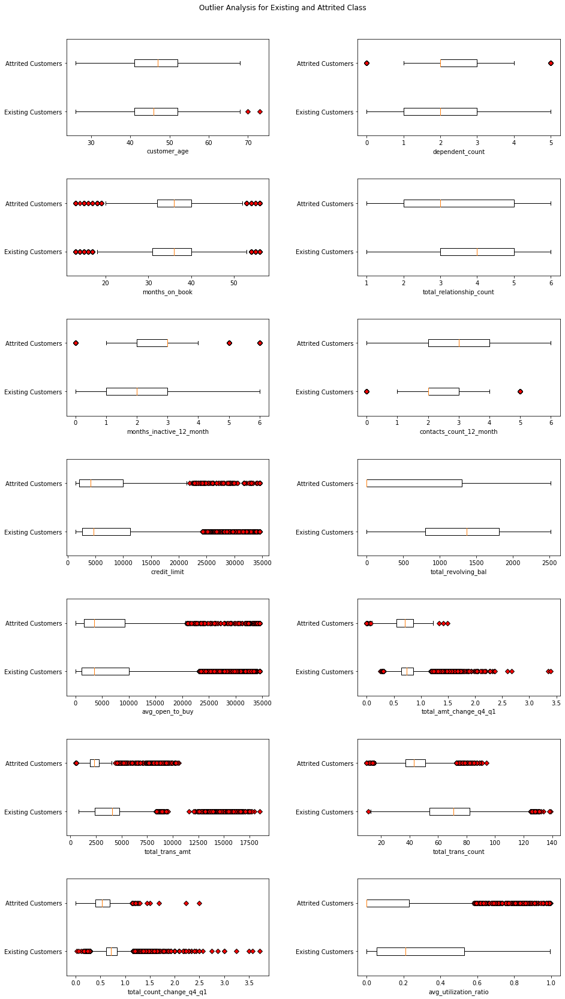

In [174]:

Existing_Dataset = Churn_Dataset[(Churn_Dataset['attrition_flag'] == "Existing Customer")]
Attrited_Dataset = Churn_Dataset[(Churn_Dataset['attrition_flag'] == "Attrited Customer")]
red_diamond = dict(markerfacecolor='r', marker='D')
fig, axs = plt.subplots(7,2, figsize=(14,24))
fig.suptitle('Outlier Analysis for Existing and Attrited Class')
idx =0 

for i in range(7):
    for j in range(2):
        data = [Existing_Dataset[numerical[idx]], Attrited_Dataset[numerical[idx]]]
        axs[i][j].set_xlabel(numerical[idx])
        axs[i][j].boxplot(data, flierprops = red_diamond, vert=0)
        axs[i][j].set_yticks([1, 2], ["Existing Customers", "Attrited Customers"])
    
        idx +=1
        
        if idx == len(features):
            break;
            

fig.tight_layout(pad=4.0)
plt.show() 

### Analysis on Catergoral Variables
The categoral variables in the dataset are analyzed below </br>
We find that the dataset is highly imbalance with only 16% of churning customer </br>
Class balancing techniques will the used to tackle this </br>
[Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

In [22]:
for cat in categorical:
    print('Variable:', cat)
    print('Unique values:', Churn_Dataset[cat].nunique() )
    print( Churn_Dataset[cat].value_counts() )
    print()

Variable: attrition_flag
Unique values: 2
Existing Customer    8500
Attrited Customer    1627
Name: attrition_flag, dtype: int64

Variable: gender
Unique values: 2
F    5358
M    4769
Name: gender, dtype: int64

Variable: education_level
Unique values: 7
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: education_level, dtype: int64

Variable: marital_status
Unique values: 4
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: marital_status, dtype: int64

Variable: income_category
Unique values: 6
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: income_category, dtype: int64

Variable: card_category
Unique values: 4
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: card_category, dtype: int64



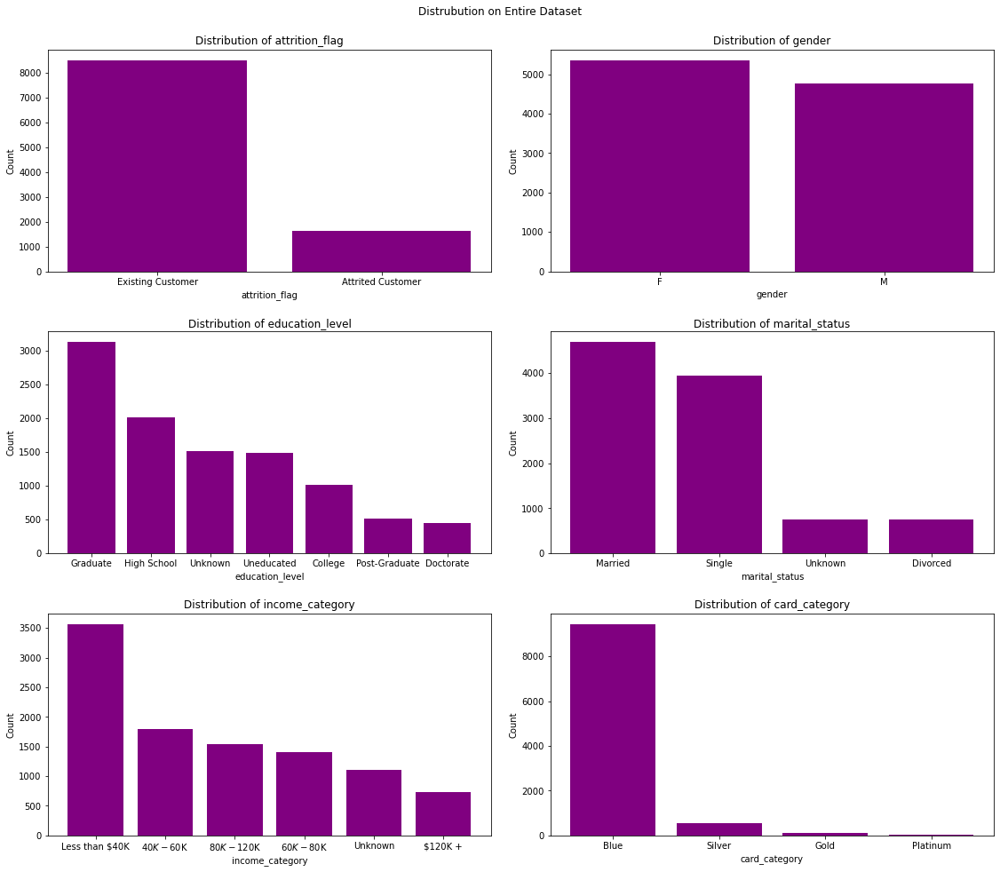

In [23]:
features = list(Churn_Dataset.columns)

fig, axs = plt.subplots(3,2, figsize=(16,14))
fig.suptitle('Distrubution on Entire Dataset')

idx =0 

for i in range(3):
    for j in range(2):
        
        df = Churn_Dataset[categorical[idx]].value_counts()
        axs[i,j].bar(df.index,df.values, color = 'purple')
        axs[i,j].set_title("Distribution of " +categorical[idx])
        axs[i,j].set(ylabel='Count')
        axs[i,j].set(xlabel=categorical[idx])
        idx +=1
        
        if idx == len(categorical):
                break;
            

fig.tight_layout(pad=2.0)
plt.show()   



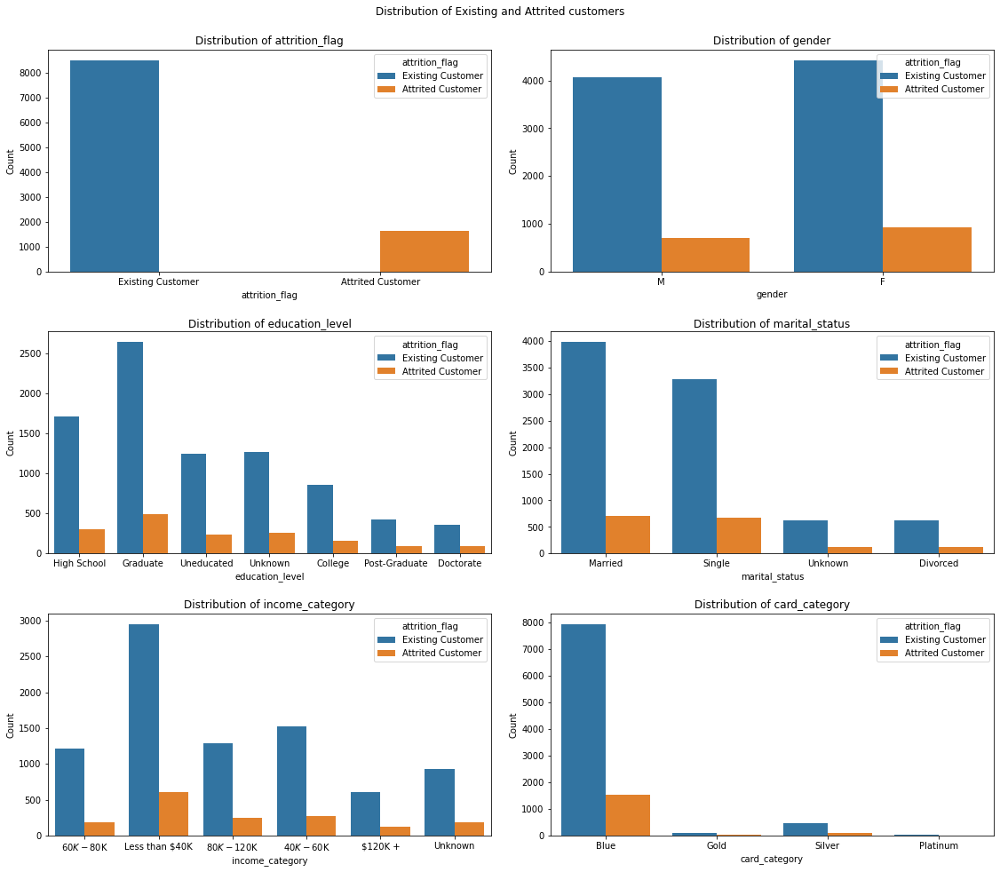

In [24]:
features = list(Churn_Dataset.columns)
fig, axs = plt.subplots(3, 2, figsize=(16, 14))
fig.suptitle("Distribution of Existing and Attrited customers")
idx =0 

for i in range(3):
    for j in range(2):
        
        sns.countplot(ax=axs[i,j], x=categorical[idx],hue='attrition_flag',data=Churn_Dataset)
        axs[i,j].set_title("Distribution of " +categorical[idx])
        axs[i,j].set(ylabel='Count')
        axs[i,j].set(xlabel=categorical[idx])
        idx +=1
        
        if idx == len(categorical):
                break;
            

fig.tight_layout(pad=2.0)
plt.show()   



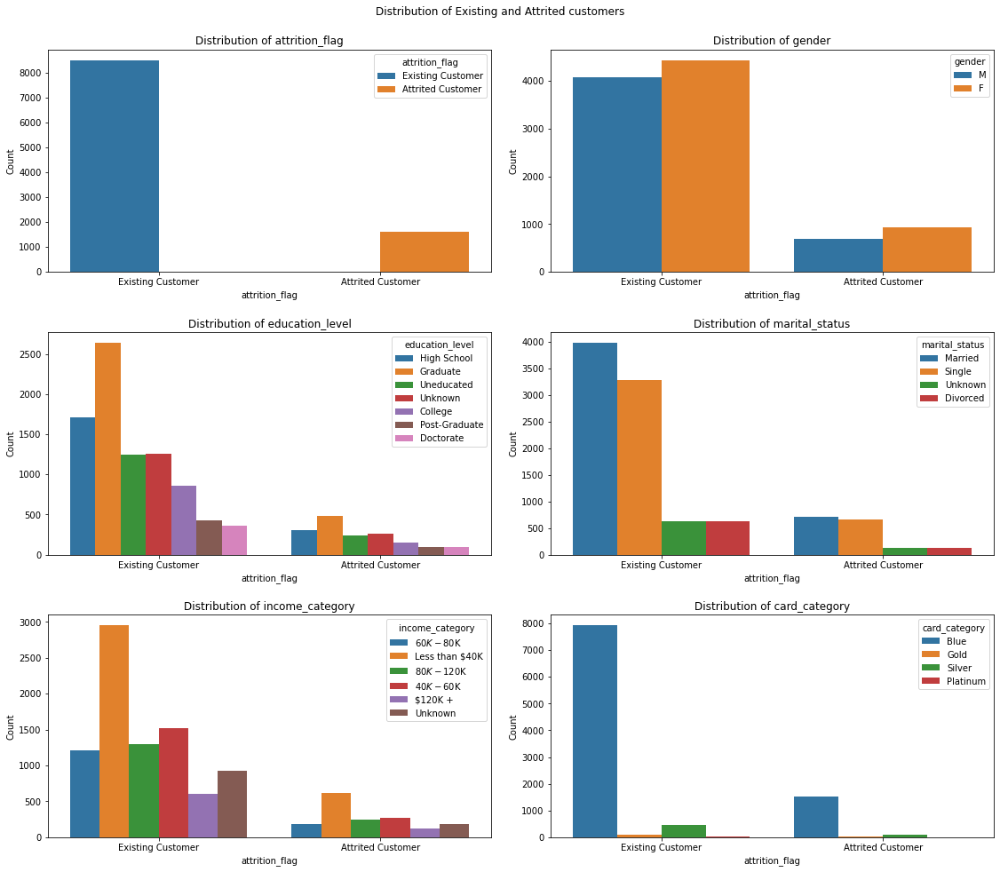

In [25]:
features = list(Churn_Dataset.columns)
fig, axs = plt.subplots(3, 2, figsize=(16, 14))
fig.suptitle("Distribution of Existing and Attrited customers")
idx =0 

for i in range(3):
    for j in range(2):
        
        sns.countplot(ax=axs[i,j], hue=categorical[idx],x='attrition_flag',data=Churn_Dataset)
        axs[i,j].set_title("Distribution of " +categorical[idx])
        axs[i,j].set(ylabel='Count')
        idx +=1
        
        if idx == len(categorical):
                break;
            

fig.tight_layout(pad=2.0)
plt.show()   


In [13]:
fig = px.pie(Churn_Dataset,names='attrition_flag',title='Percentage of Existing and Attrited Customers',
             hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label+value', rotation=29)
fig.show()
print('Total number of customers:',Churn_Dataset['attrition_flag'].count())
print(Churn_Dataset['attrition_flag'].value_counts())

px.histogram(Churn_Dataset, x="attrition_flag", color="attrition_flag")


Total number of customers: 10127
Existing Customer    8500
Attrited Customer    1627
Name: attrition_flag, dtype: int64


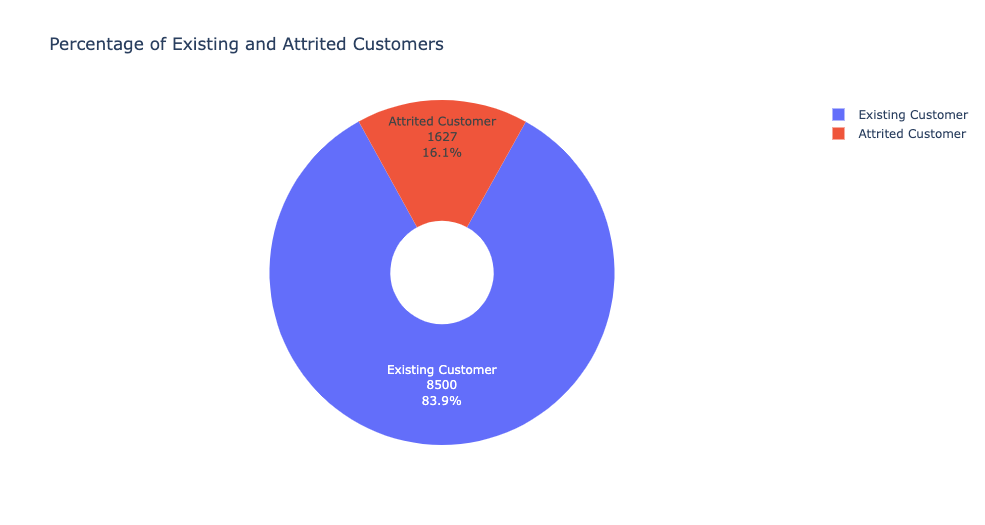

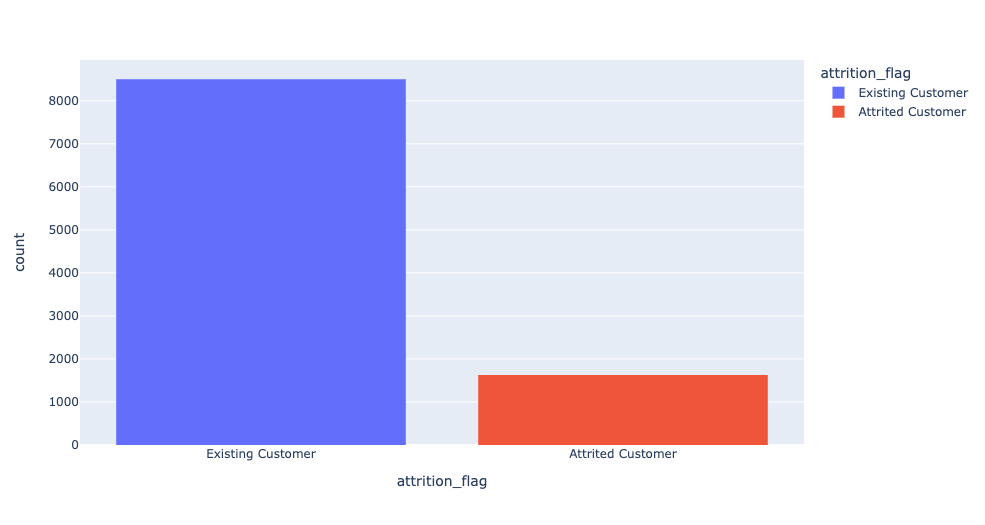

In [14]:
fig = px.pie(Churn_Dataset,names='gender',title='Percentage of Male and Female Customers',hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()
print('Total number of customers:',Churn_Dataset['gender'].count())
print(Churn_Dataset['gender'].value_counts())
px.histogram(Churn_Dataset, x="gender", color="attrition_flag")

Total number of customers: 10127
F    5358
M    4769
Name: gender, dtype: int64


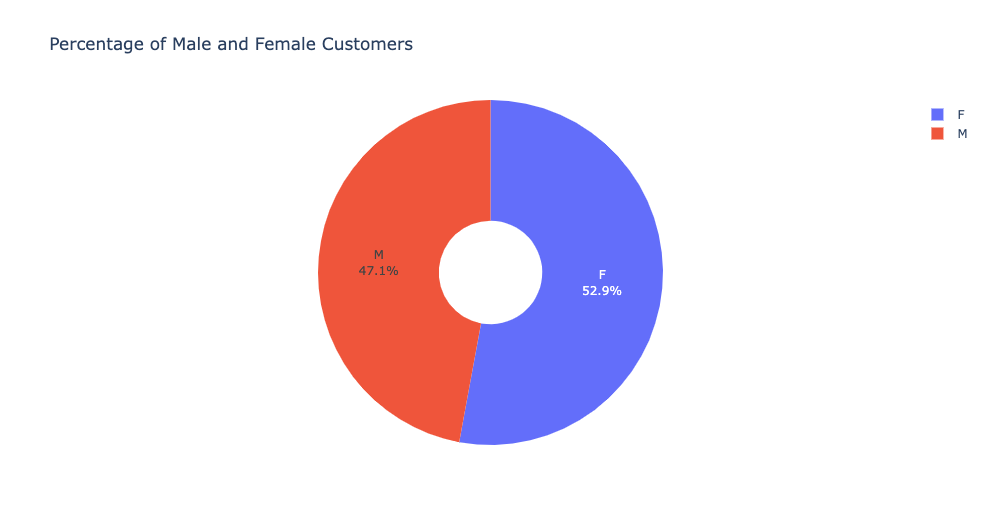

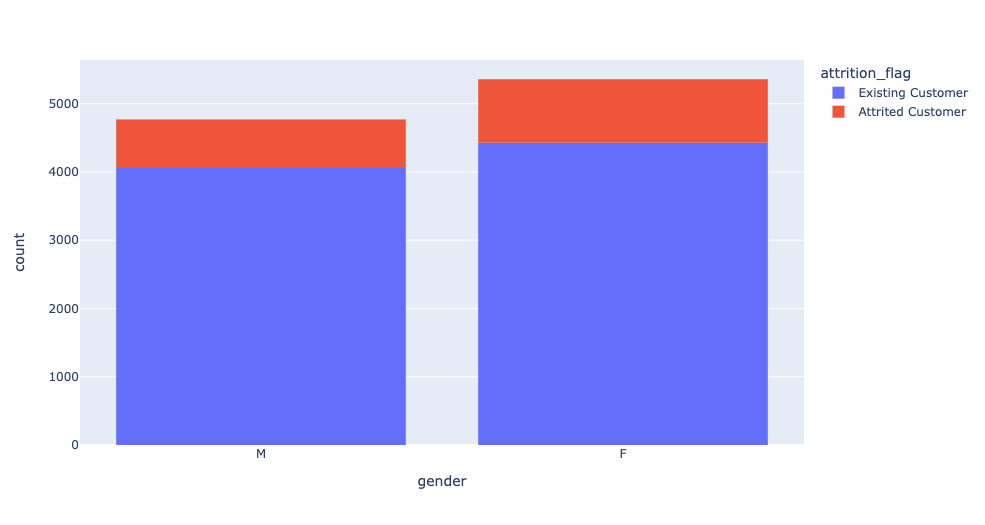

In [15]:
fig = px.pie(Churn_Dataset,names='education_level',title='Percentage of Educated Customers',hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()
print('Total number of customers:',Churn_Dataset['education_level'].count())
print(Churn_Dataset['education_level'].value_counts())
px.histogram(Churn_Dataset, x="education_level", color="attrition_flag")

Total number of customers: 10127
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: education_level, dtype: int64


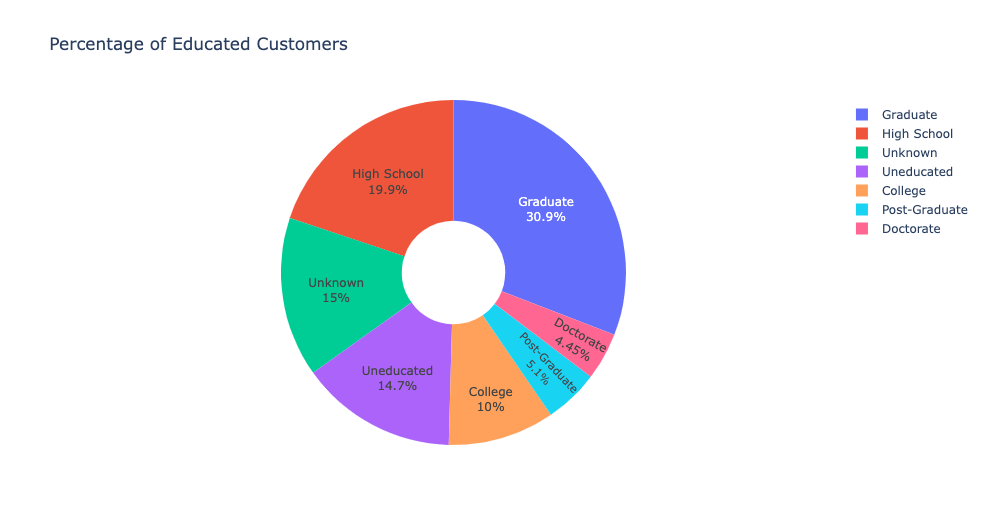

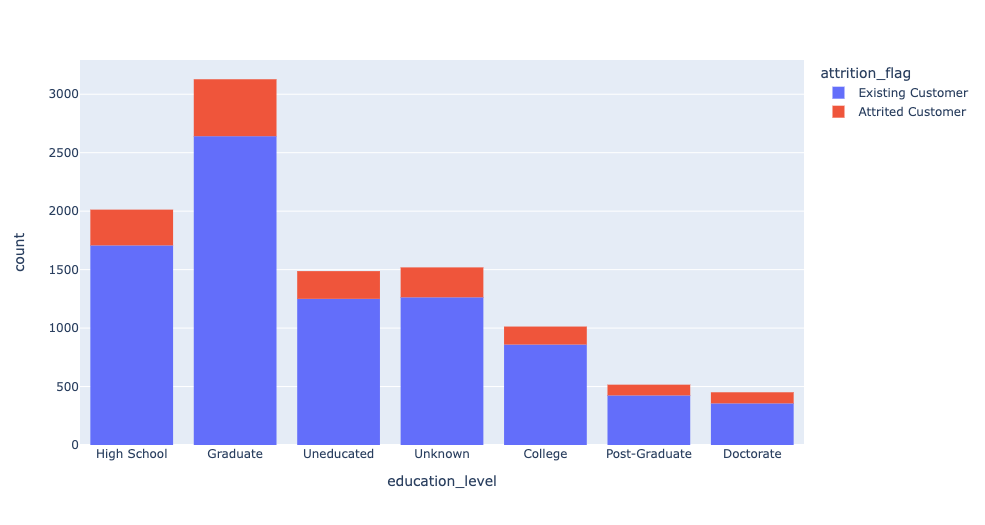

In [17]:
fig = px.pie(Churn_Dataset,names='marital_status',title='Percentage of Married Customers',hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()
print('Total number of customers:',Churn_Dataset['marital_status'].count())
print(Churn_Dataset['marital_status'].value_counts())
px.histogram(Churn_Dataset, x="marital_status", color="attrition_flag")

Total number of customers: 10127
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: marital_status, dtype: int64


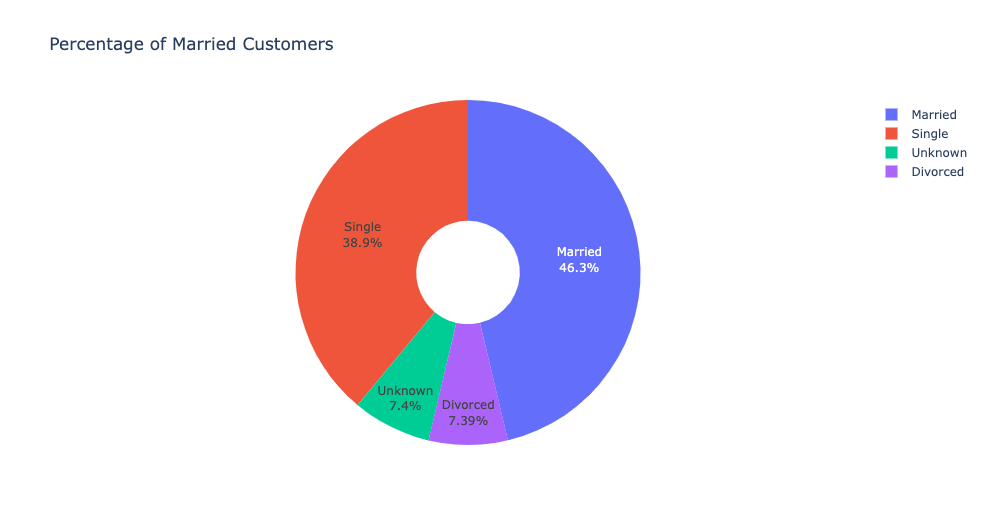

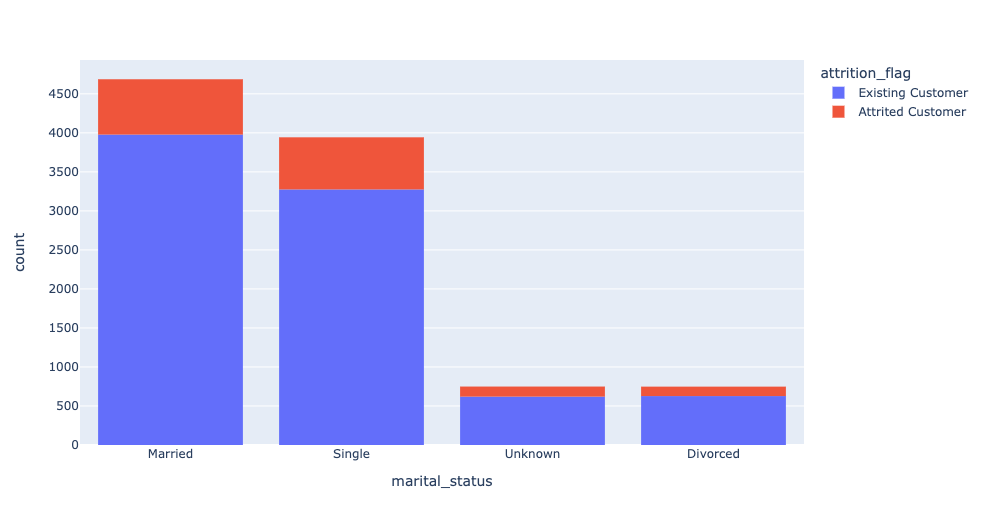

In [18]:
fig = px.pie(Churn_Dataset,names='income_category',title='Percentage of Income distribution',hole=0.3)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()
print('Total number of customers:',Churn_Dataset['income_category'].count())
print(Churn_Dataset['income_category'].value_counts())
px.histogram(Churn_Dataset, x="income_category", color="attrition_flag")

Total number of customers: 10127
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: income_category, dtype: int64


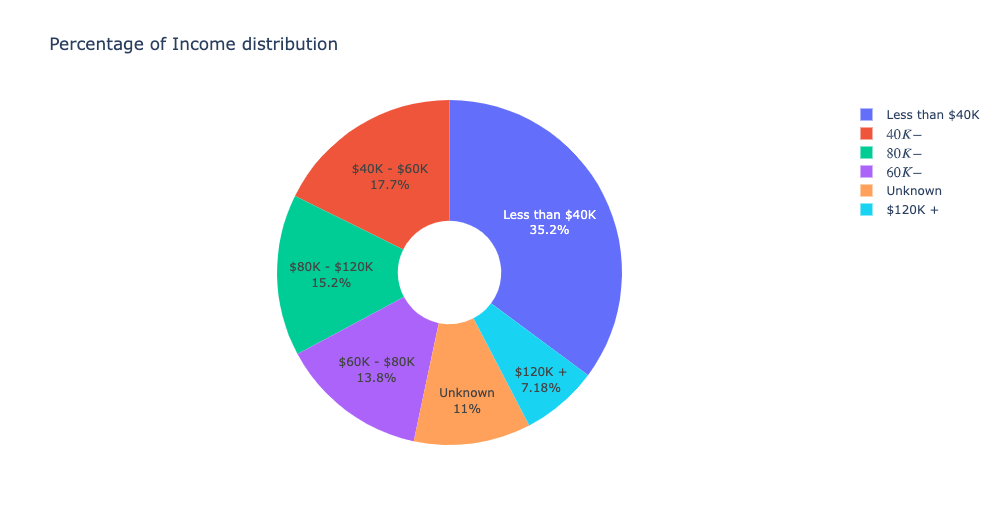

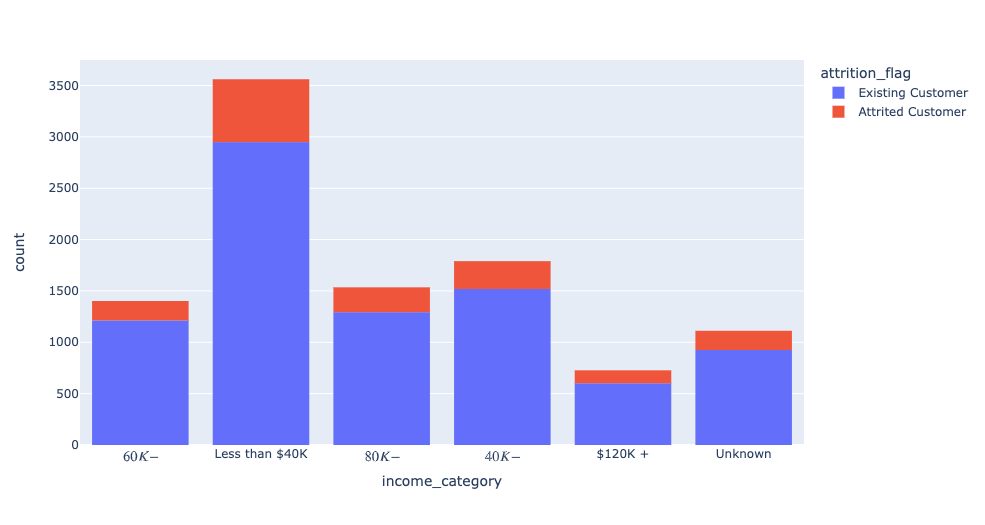

In [19]:
fig = px.pie(Churn_Dataset,names='card_category',title='Percentage of Card Distribution',hole=0.3)
fig.update_traces(textposition='outside', textinfo='percent+label')
fig.show()
print('Total number of customers:',Churn_Dataset['card_category'].count())
print(Churn_Dataset['card_category'].value_counts())
px.histogram(Churn_Dataset, x="card_category", color="attrition_flag")

Total number of customers: 10127
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: card_category, dtype: int64


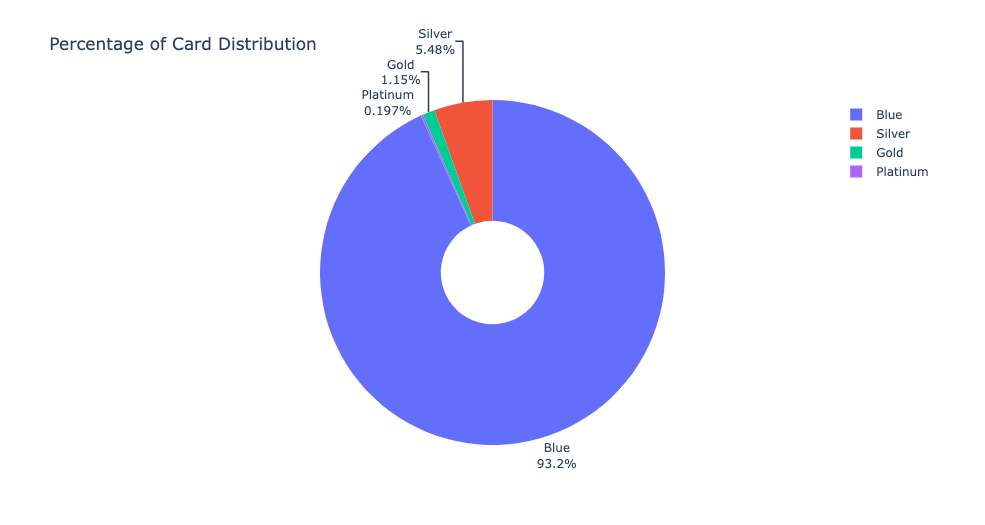

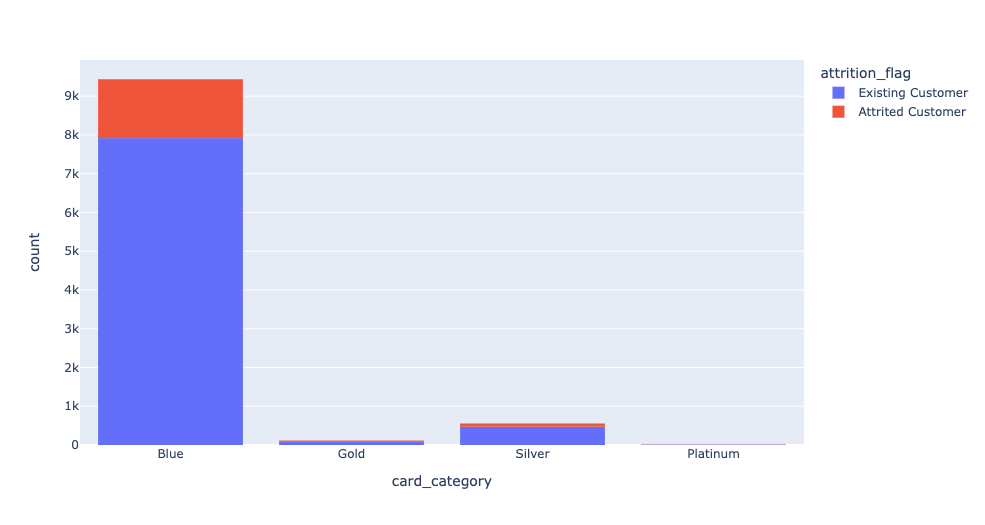

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

# 2. Data Preparation

Data Preparation include data preprocessing and feature selection

### 2.1 Data Preprocessing

In [175]:
Churn_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   attrition_flag            10127 non-null  object 
 1   customer_age              10127 non-null  int64  
 2   gender                    10127 non-null  object 
 3   dependent_count           10127 non-null  int64  
 4   education_level           10127 non-null  object 
 5   marital_status            10127 non-null  object 
 6   income_category           10127 non-null  object 
 7   card_category             10127 non-null  object 
 8   months_on_book            10127 non-null  int64  
 9   total_relationship_count  10127 non-null  int64  
 10  months_inactive_12_month  10127 non-null  int64  
 11  contacts_count_12_month   10127 non-null  int64  
 12  credit_limit              10127 non-null  float64
 13  total_revolving_bal       10127 non-null  int64  
 14  avg_op

In [176]:
Churn_Dataset.loc[Churn_Dataset["attrition_flag"] == "Existing Customer", "attrition_flag"] = 0
Churn_Dataset.loc[Churn_Dataset["attrition_flag"] == "Attrited Customer", "attrition_flag"] = 1

In [177]:
Churn_Dataset["attrition_flag"] = Churn_Dataset["attrition_flag"].astype('category').cat.codes
Churn_Dataset["gender"] = Churn_Dataset["gender"].astype('category').cat.codes
Churn_Dataset["education_level"] = Churn_Dataset["education_level"].astype('category').cat.codes
Churn_Dataset["marital_status"] = Churn_Dataset["marital_status"].astype('category').cat.codes
Churn_Dataset["income_category"] = Churn_Dataset["income_category"].astype('category').cat.codes
Churn_Dataset["card_category"] = Churn_Dataset["card_category"].astype('category').cat.codes

In [178]:
Churn_Dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   attrition_flag            10127 non-null  int8   
 1   customer_age              10127 non-null  int64  
 2   gender                    10127 non-null  int8   
 3   dependent_count           10127 non-null  int64  
 4   education_level           10127 non-null  int8   
 5   marital_status            10127 non-null  int8   
 6   income_category           10127 non-null  int8   
 7   card_category             10127 non-null  int8   
 8   months_on_book            10127 non-null  int64  
 9   total_relationship_count  10127 non-null  int64  
 10  months_inactive_12_month  10127 non-null  int64  
 11  contacts_count_12_month   10127 non-null  int64  
 12  credit_limit              10127 non-null  float64
 13  total_revolving_bal       10127 non-null  int64  
 14  avg_op

In [179]:
Churn_Dataset.head()

,attrition_flag,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_month,contacts_count_12_month,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_change_q4_q1,total_trans_amt,total_trans_count,total_count_change_q4_q1,avg_utilization_ratio
0,0,45,1,3,3,1,2,0,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,0,5,2,2,4,0,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,1,3,2,1,3,0,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,0,4,3,3,4,0,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,1,3,5,1,2,0,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

### 2.2 Feature Selection

Multicollinearity of the features is examines using Variance Inflator Factor (VIF) and Correlation heatmap<br>

If the proportion of cases in the reference category is small, the indicator variables will necessarily have high VIFs, even if the categorical variable is not associated with other variables in the model. <br>


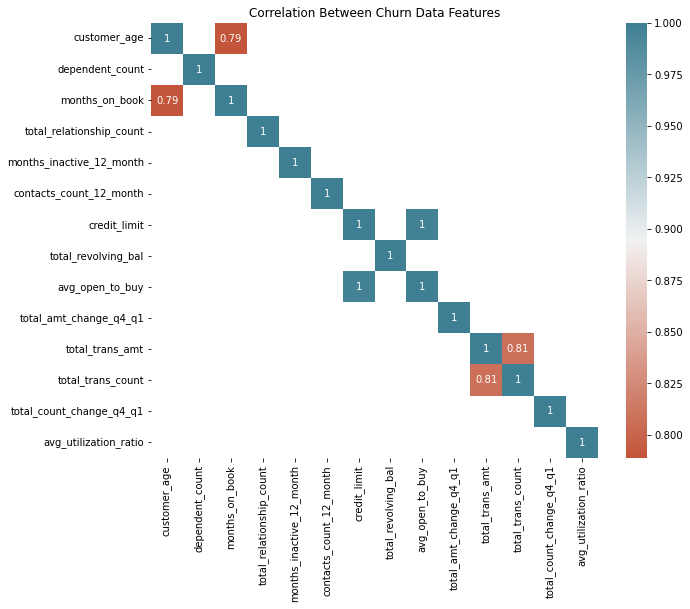

In [202]:
#corr = Churn_Dataset.loc[:,numerical].corr()
corr = Churn_Dataset.corr()
kot = corr[(corr>= 0.65) | (corr <= -0.65)]
plt.figure(figsize = (10,8))   
dataplot=sns.heatmap(kot,cmap=sns.diverging_palette(20, 220, n=200), annot=True)
plt.title('Correlation Between Churn Data Features')
plt.show()

In [38]:
# Find most important features relative to target Price
print("Find most important features relative to Attrition-target")
corr = Churn_Dataset.corr()
corr.sort_values(["attrition_flag"], ascending = False, inplace = True)
print(corr.attrition_flag)

Find most important features relative to Attrition-target
attrition_flag              1.000000
contacts_count_12_month     0.204491
months_inactive_12_month    0.152449
dependent_count             0.018991
marital_status              0.018597
customer_age                0.018203
income_category             0.017584
months_on_book              0.013687
education_level             0.005551
avg_open_to_buy            -0.000285
card_category              -0.006038
credit_limit               -0.023873
gender                     -0.037272
total_amt_change_q4_q1     -0.131063
total_relationship_count   -0.150005
total_trans_amt            -0.168598
avg_utilization_ratio      -0.178410
total_revolving_bal        -0.263053
total_count_change_q4_q1   -0.290054
total_trans_count          -0.371403
Name: attrition_flag, dtype: float64


In [39]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
  
def getVIF(Features):    
    vif_data = pd.DataFrame()
    vif_data["Feature"] = Features.columns

    # calculating VIF for each feature
    vif_data["VIF"] = [variance_inflation_factor(Features.values, i)
                              for i in range(len(Features.columns))]
    
    #vif_data = vif_data.sort_values(by=['VIF'])
    return vif_data

In [40]:
print(getVIF(Churn_Dataset))

                     Feature        VIF
0             attrition_flag   1.722131
1               customer_age  78.584809
2                     gender   3.044941
3            dependent_count   4.157959
4            education_level   3.779161
5             marital_status   4.888498
6            income_category   6.054733
7              card_category   1.450983
8             months_on_book  56.471276
9   total_relationship_count   7.733309
10  months_inactive_12_month   6.421824
11   contacts_count_12_month   5.988586
12              credit_limit        inf
13       total_revolving_bal        inf
14           avg_open_to_buy        inf
15    total_amt_change_q4_q1  14.208921
16           total_trans_amt   9.027608
17         total_trans_count  27.121943
18  total_count_change_q4_q1  12.229861
19     avg_utilization_ratio   5.841103


/opt/anaconda3/envs/tensorflow3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning:

divide by zero encountered in double_scalars



From the above we find that credit limit and average open to buy are perfectly correlated


Both attributes have a VIF of infinity. However, credit limit a higher correlation to the target and thus a higher relative importance than average open to buy. There average open to buy attribute is eliminated

In [41]:
Churn_Dataset = Churn_Dataset.drop(["avg_open_to_buy"],axis=1)

We then examine the remaining features

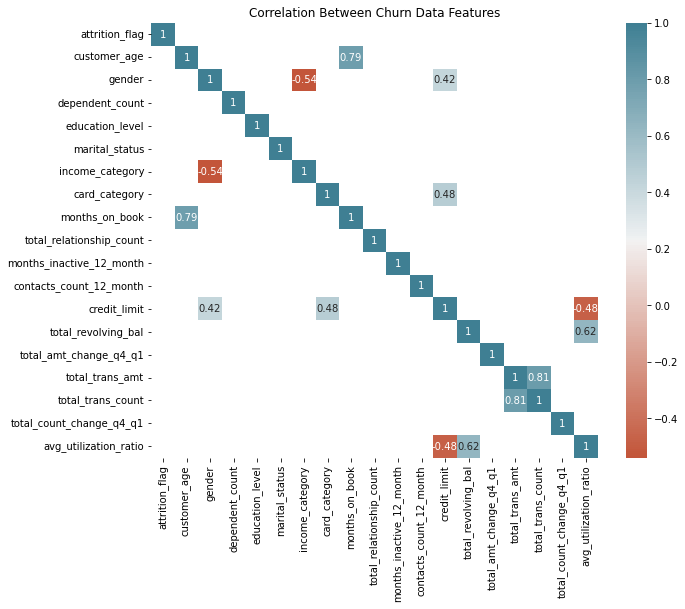

In [46]:
corr = Churn_Dataset.corr()
kot = corr[(corr>= 0.65) | (corr <= -0.65)]
plt.figure(figsize = (10,8))   
dataplot=sns.heatmap(kot,cmap=sns.diverging_palette(20, 220, n=200), annot=True)
plt.title('Correlation Between Churn Data Features')
plt.show()

In [43]:
print(getVIF(Churn_Dataset))

                     Feature        VIF
0             attrition_flag   1.722131
1               customer_age  78.584809
2                     gender   3.044941
3            dependent_count   4.157959
4            education_level   3.779161
5             marital_status   4.888498
6            income_category   6.054733
7              card_category   1.450983
8             months_on_book  56.471276
9   total_relationship_count   7.733309
10  months_inactive_12_month   6.421824
11   contacts_count_12_month   5.988586
12              credit_limit   4.445031
13       total_revolving_bal   7.008476
14    total_amt_change_q4_q1  14.208921
15           total_trans_amt   9.027608
16         total_trans_count  27.121943
17  total_count_change_q4_q1  12.229861
18     avg_utilization_ratio   5.841103


Next Age is dropped as it has a high VIF

In [60]:
Churn_Dataset = Churn_Dataset.drop(["customer_age"],axis=1)

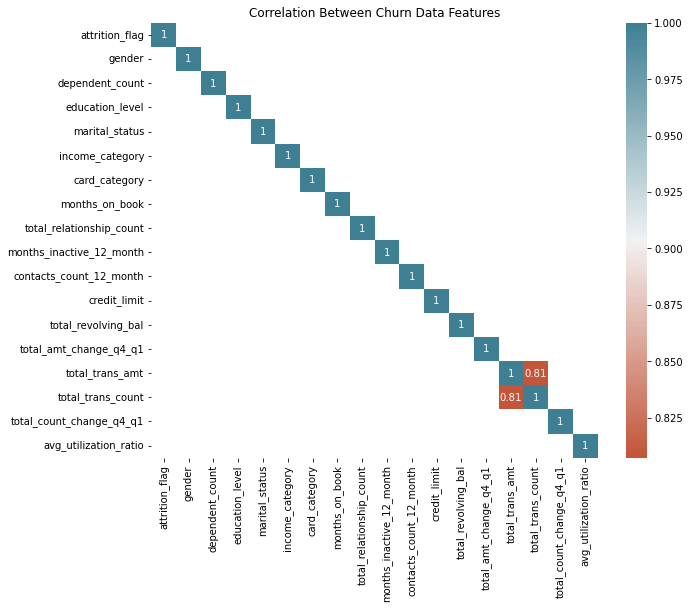

In [65]:
corr = Churn_Dataset.corr()
kot = corr[(corr>= 0.65) | (corr <= -0.65)]
plt.figure(figsize = (10,8))   
dataplot=sns.heatmap(kot,cmap=sns.diverging_palette(20, 220, n=200), annot=True)
plt.title('Correlation Between Churn Data Features')
plt.show()

In [64]:
print(getVIF(Churn_Dataset))

                     Feature        VIF
0             attrition_flag   1.694696
1                     gender   3.029044
2            dependent_count   4.155335
3            education_level   3.758904
4             marital_status   4.868930
5            income_category   5.992585
6              card_category   1.450516
7             months_on_book  16.316212
8   total_relationship_count   7.634644
9   months_inactive_12_month   6.401130
10   contacts_count_12_month   5.959895
11              credit_limit   4.435344
12       total_revolving_bal   7.004793
13    total_amt_change_q4_q1  14.127681
14           total_trans_amt   9.005090
15         total_trans_count  26.697976
16  total_count_change_q4_q1  12.125587
17     avg_utilization_ratio   5.827309


Next total transaction count is dropped and is highly correlated with months on the book

In [66]:
Churn_Dataset = Churn_Dataset.drop(["total_trans_count"],axis=1)

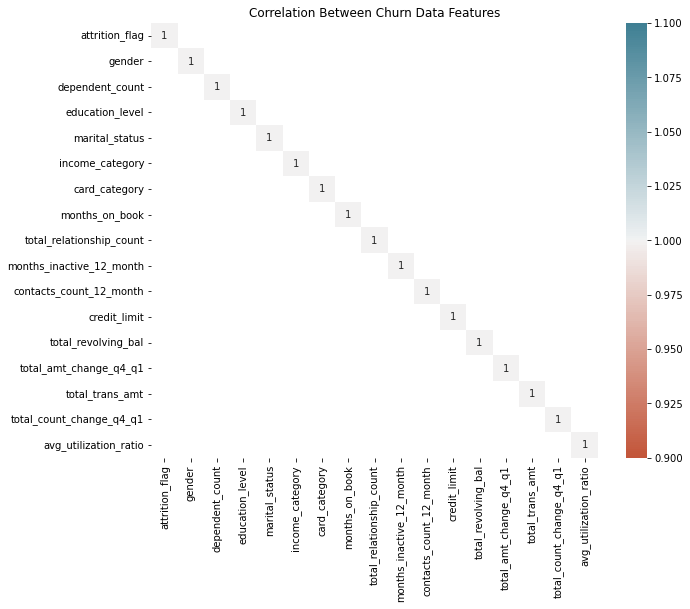

In [67]:
corr = Churn_Dataset.corr()
kot = corr[(corr>= 0.65) | (corr <= -0.65)]
plt.figure(figsize = (10,8))   
dataplot=sns.heatmap(kot,cmap=sns.diverging_palette(20, 220, n=200), annot=True)
plt.title('Correlation Between Churn Data Features')
plt.show()

In [68]:
print(getVIF(Churn_Dataset))

                     Feature        VIF
0             attrition_flag   1.512246
1                     gender   3.028587
2            dependent_count   4.023214
3            education_level   3.746942
4             marital_status   4.733677
5            income_category   5.889528
6              card_category   1.450282
7             months_on_book  15.531866
8   total_relationship_count   7.519588
9   months_inactive_12_month   6.306495
10   contacts_count_12_month   5.915329
11              credit_limit   4.429239
12       total_revolving_bal   6.923839
13    total_amt_change_q4_q1  14.101028
14           total_trans_amt   3.147224
15  total_count_change_q4_q1  12.068878
16     avg_utilization_ratio   5.741700


In [71]:
display(Churn_Dataset.head())
Churn_Dataset.shape

,attrition_flag,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_month,contacts_count_12_month,credit_limit,total_revolving_bal,total_amt_change_q4_q1,total_trans_amt,total_count_change_q4_q1,avg_utilization_ratio
0,0,1,3,3,1,2,0,39,5,1,3,12691.0,777,1.335,1144,1.625,0.061
1,0,0,5,2,2,4,0,44,6,1,2,8256.0,864,1.541,1291,3.714,0.105
2,0,1,3,2,1,3,0,36,4,1,0,3418.0,0,2.594,1887,2.333,0.000
3,0,0,4,3,3,4,0,34,3,4,1,3313.0,2517,1.405,1171,2.333,0.760
4,0,1,3,5,1,2,0,21,5,1,0,4716.0,0,2.175,816,2.500,0.000


(10127, 17)

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 3. Artificial Neural Network Epoch Selection

The below finds the best epoch for the artificial neural network

In [75]:
def ANN_model():
    model = Sequential()

    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(32,activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(16,activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(8,activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1,activation='sigmoid'))
    
    model.compile(optimizer='adam', 
                  loss='binary_crossentropy',
                  metrics=['acc'])

    return model

In [76]:
ann_model = ANN_model()
X_ann = Churn_Dataset.drop(["attrition_flag"],axis=1)
y_ann = Churn_Dataset["attrition_flag"]
oversample = SMOTE()
X_ann, y_ann = oversample.fit_resample(X_ann, y_ann)

X_ann = np.asarray(X_ann)
y_ann = np.asarray(y_ann)

mean = X_ann.mean(axis=0)
X_ann -= mean
std = X_ann.std(axis=0)
X_ann /= std


history1 = ann_model.fit(X_ann, 
                         y_ann, 
                         epochs=500, 
                         batch_size=128, 
                         validation_split=0.2, 
                         verbose=1)


Train on 13600 samples, validate on 3400 samples
Epoch 1/500
13600/13600 [==============================] - 5s 362us/sample - loss: 0.6263 - acc: 0.6356 - val_loss: 0.5763 - val_acc: 0.6956
Epoch 2/500
13600/13600 [==============================] - 2s 166us/sample - loss: 0.4740 - acc: 0.7924 - val_loss: 0.5095 - val_acc: 0.7262
Epoch 3/500
13600/13600 [==============================] - 2s 146us/sample - loss: 0.4281 - acc: 0.8216 - val_loss: 0.4709 - val_acc: 0.7544
Epoch 4/500
13600/13600 [==============================] - 3s 190us/sample - loss: 0.4064 - acc: 0.8329 - val_loss: 0.4429 - val_acc: 0.7700
Epoch 5/500
13600/13600 [==============================] - 2s 161us/sample - loss: 0.3819 - acc: 0.8456 - val_loss: 0.3806 - val_acc: 0.8326
Epoch 6/500
13600/13600 [==============================] - 2s 161us/sample - loss: 0.3690 - acc: 0.8491 - val_loss: 0.3846 - val_acc: 0.8356
Epoch 7/500
13600/13600 [==============================] - 2s 161us/sample - loss: 0.3514 - acc: 0.8598 -

13600/13600 [==============================] - 2s 147us/sample - loss: 0.1322 - acc: 0.9520 - val_loss: 0.1154 - val_acc: 0.9662
Epoch 116/500
13600/13600 [==============================] - 2s 128us/sample - loss: 0.1361 - acc: 0.9489 - val_loss: 0.1158 - val_acc: 0.9665
Epoch 117/500
13600/13600 [==============================] - 2s 160us/sample - loss: 0.1342 - acc: 0.9498 - val_loss: 0.1060 - val_acc: 0.9700
Epoch 118/500
13600/13600 [==============================] - 3s 188us/sample - loss: 0.1315 - acc: 0.9526 - val_loss: 0.1080 - val_acc: 0.9685
Epoch 119/500
13600/13600 [==============================] - 2s 142us/sample - loss: 0.1320 - acc: 0.9515 - val_loss: 0.0923 - val_acc: 0.9741
Epoch 120/500
13600/13600 [==============================] - 2s 125us/sample - loss: 0.1369 - acc: 0.9509 - val_loss: 0.1034 - val_acc: 0.9703
Epoch 121/500
13600/13600 [==============================] - 1s 110us/sample - loss: 0.1367 - acc: 0.9508 - val_loss: 0.1151 - val_acc: 0.9650
Epoch 122/500

13600/13600 [==============================] - 1s 109us/sample - loss: 0.1127 - acc: 0.9596 - val_loss: 0.0897 - val_acc: 0.9726
Epoch 230/500
13600/13600 [==============================] - 2s 112us/sample - loss: 0.1144 - acc: 0.9567 - val_loss: 0.0965 - val_acc: 0.9715
Epoch 231/500
13600/13600 [==============================] - 2s 121us/sample - loss: 0.1057 - acc: 0.9624 - val_loss: 0.0997 - val_acc: 0.9694
Epoch 232/500
13600/13600 [==============================] - 2s 111us/sample - loss: 0.1043 - acc: 0.9622 - val_loss: 0.0858 - val_acc: 0.9744
Epoch 233/500
13600/13600 [==============================] - 2s 118us/sample - loss: 0.1102 - acc: 0.9615 - val_loss: 0.0891 - val_acc: 0.9703
Epoch 234/500
13600/13600 [==============================] - 2s 111us/sample - loss: 0.1132 - acc: 0.9592 - val_loss: 0.0844 - val_acc: 0.9741
Epoch 235/500
13600/13600 [==============================] - 2s 112us/sample - loss: 0.1143 - acc: 0.9593 - val_loss: 0.1019 - val_acc: 0.9676
Epoch 236/500

13600/13600 [==============================] - 3s 227us/sample - loss: 0.1018 - acc: 0.9624 - val_loss: 0.0846 - val_acc: 0.9712
Epoch 344/500
13600/13600 [==============================] - 3s 244us/sample - loss: 0.1046 - acc: 0.9623 - val_loss: 0.0868 - val_acc: 0.9703
Epoch 345/500
13600/13600 [==============================] - 3s 246us/sample - loss: 0.1027 - acc: 0.9646 - val_loss: 0.1077 - val_acc: 0.9618
Epoch 346/500
13600/13600 [==============================] - 4s 261us/sample - loss: 0.1056 - acc: 0.9633 - val_loss: 0.0837 - val_acc: 0.9738
Epoch 347/500
13600/13600 [==============================] - 2s 174us/sample - loss: 0.0970 - acc: 0.9657 - val_loss: 0.0781 - val_acc: 0.9735
Epoch 348/500
13600/13600 [==============================] - 2s 181us/sample - loss: 0.1019 - acc: 0.9641 - val_loss: 0.0754 - val_acc: 0.9744
Epoch 349/500
13600/13600 [==============================] - 2s 170us/sample - loss: 0.1006 - acc: 0.9654 - val_loss: 0.0973 - val_acc: 0.9659
Epoch 350/500

13600/13600 [==============================] - 5s 388us/sample - loss: 0.0949 - acc: 0.9671 - val_loss: 0.0782 - val_acc: 0.9750
Epoch 458/500
13600/13600 [==============================] - 5s 341us/sample - loss: 0.0985 - acc: 0.9649 - val_loss: 0.0744 - val_acc: 0.9779
Epoch 459/500
13600/13600 [==============================] - 5s 402us/sample - loss: 0.1039 - acc: 0.9651 - val_loss: 0.0893 - val_acc: 0.9703
Epoch 460/500
13600/13600 [==============================] - 5s 375us/sample - loss: 0.0994 - acc: 0.9640 - val_loss: 0.0869 - val_acc: 0.9679
Epoch 461/500
13600/13600 [==============================] - 5s 376us/sample - loss: 0.0962 - acc: 0.9647 - val_loss: 0.0771 - val_acc: 0.9741
Epoch 462/500
13600/13600 [==============================] - 6s 421us/sample - loss: 0.1004 - acc: 0.9642 - val_loss: 0.0897 - val_acc: 0.9688
Epoch 463/500
13600/13600 [==============================] - 5s 369us/sample - loss: 0.0977 - acc: 0.9653 - val_loss: 0.0808 - val_acc: 0.9729
Epoch 464/500

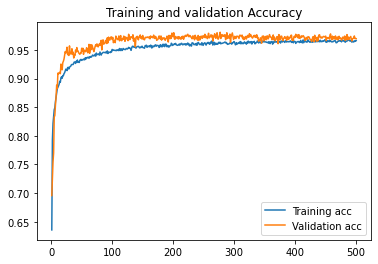

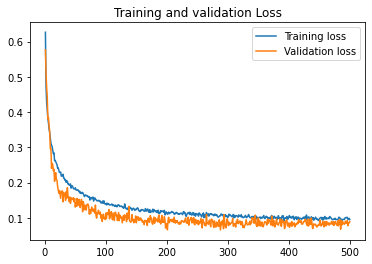

In [78]:
acc = history1.history['acc']
val_acc = history1.history['val_acc']
 
loss = history1.history['loss']
val_loss = history1.history['val_loss']

epochs = range(1, 501)
 
plt.figure()
 
plt.plot(epochs, acc, label='Training acc')
plt.plot(epochs, val_acc, label='Validation acc')
plt.title('Training and validation Accuracy')
plt.legend()
plt.show()


plt.plot(epochs, loss, label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and validation Loss')
plt.legend()
plt.show()

In [79]:
best_epoch_model = np.argmin(history1.history['val_loss'])
print("best epoch:%s \nvalidation loss:%.3f \nvalidation acc:%.3f"%(best_epoch_model, 
                                                                 history1.history['val_loss'][best_epoch_model], 
                                                                 history1.history['val_acc'][best_epoch_model]))

best epoch:287 
validation loss:0.066 
validation acc:0.980


Using the plot above we can choose 250 as the epoch values

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 4. Cross Validation using Machine Learning and Deep Learning models

The models are developed using a 10-fold cross-validation. 

By using cross validation, we can verify how accurate the model is performing on multiple and different subsets of data, therefore, ensuring that it generalizes well to the new samples.

In [80]:
def get_cross_validation(X, y,models):
    fold = 0
    cv_outer = StratifiedKFold(n_splits=10, shuffle=True)
    cv_performance_df = pd.DataFrame([], columns =["Model", "Accuracy", "Precision", "Recall", "F1-Score"])
    
    for train_ix, test_ix in cv_outer.split(X,y):
        print("Fold ",fold +1)
        fold +=1
        for clf in models:
            model = models[clf]
            x_train_cv, x_test_cv = X.iloc[train_ix, :], X.iloc[test_ix, :]
            y_train_cv, y_test_cv = y[train_ix], y[test_ix]

            if clf == "ANN":
                x_train_cv = np.asarray(x_train_cv)
                x_test_cv = np.asarray(x_test_cv)

                y_train_cv = np.asarray(y_train_cv)
                y_test_cv = np.asarray(y_test_cv)

                model.fit(x_train_cv,
                          y_train_cv,
                          batch_size=128,
                          epochs=250,
                          validation_split=0.2, 
                          verbose=0)
                Model_prediction = model.predict_classes(x_test_cv)
                
            else:
                model.fit(x_train_cv, y_train_cv)
                Model_prediction = model.predict(x_test_cv)

            Model_Accuracy = accuracy_score(y_test_cv, Model_prediction)
            #print("Accuracy: " ,Model_Accuracy)

            Model_Precision = precision_score(y_test_cv, Model_prediction, zero_division =0) 
            #print("Precision: ",Model_Precision)

            Model_Recall = recall_score(y_test_cv, Model_prediction) 
            #print("Recall: ",Model_Recall)

            Model_f1_score = f1_score(y_test_cv, Model_prediction) 
            #print("F1 Score: ",Model_f1_score)
            
            cv_performance_df = cv_performance_df.append({"Model": clf,
                                                          "Accuracy": Model_Accuracy,
                                                          "Precision": Model_Precision, 
                                                          "Recall": Model_Recall,
                                                          "F1-Score": Model_f1_score}, 
                                                         ignore_index=True)
    print("Cross Validation Complete")
    return cv_performance_df

In [83]:
X = Churn_Dataset.drop(["attrition_flag"],axis=1)
y = Churn_Dataset["attrition_flag"]

classifiers = {"Random Forest":RandomForestClassifier(), 
               "SVC":SVC(), 
               "K-Nearest Neighbours": KNeighborsClassifier(),
               "Logistic Regression":LogisticRegression(max_iter=100000),
               "XGBClassifier": XGBClassifier(eval_metric="logloss",use_label_encoder=False),
               "ANN": ANN_model()}

cv_df = get_cross_validation(X,y,classifiers)

Fold  1
Fold  2
Fold  3
Fold  4
Fold  5
Fold  6
Fold  7
Fold  8
Fold  9
Fold  10
Cross Validation Complete


In [84]:
cv_df.groupby(["Model"]).mean()

,Accuracy,Precision,Recall,F1-Score
Model,,,,
ANN,0.904812,0.745803,0.520109,0.608811
K-Nearest Neighbours,0.892661,0.705268,0.571609,0.630488
Logistic Regression,0.877752,0.766837,0.346024,0.475252
Random Forest,0.950626,0.908551,0.770719,0.833494
SVC,0.839341,0.000000,0.000000,0.000000
XGBClassifier,0.963266,0.911175,0.854961,0.881958


In [85]:
cv_df.groupby(["Model"]).std()

,Accuracy,Precision,Recall,F1-Score
Model,,,,
ANN,0.025242,0.268109,0.196075,0.219886
K-Nearest Neighbours,0.009722,0.039497,0.047999,0.039601
Logistic Regression,0.007503,0.057728,0.041803,0.042331
Random Forest,0.008674,0.032781,0.039524,0.030505
SVC,0.000401,0.000000,0.000000,0.000000
XGBClassifier,0.006515,0.023612,0.027856,0.021758


##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## Class Balancing Techniques

Only a small percentage of 16.1% of the customers who have decided to churn, therefore class balancing techniques will be required to improve the modelling performance. The experiment carried out for the SMOTE dataset and the Randomly Sampled Dataset. 

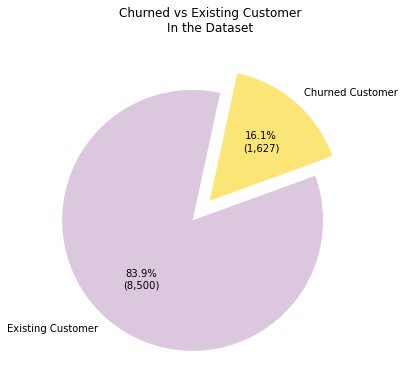

In [86]:
true_count = Churn_Dataset[Churn_Dataset['attrition_flag'] == 1].shape[0]
false_count = Churn_Dataset[Churn_Dataset['attrition_flag'] == 0].shape[0]

total = Churn_Dataset.shape[0]
input_data = [true_count, false_count]
labels = ['Churned Customer', 'Existing Customer']
explode = [0,0.2]
plt.figure(figsize = (8, 6))
colors = ["#fce577", "#dcc8de"]
#create pie chart
plt.pie(input_data, labels = labels, 
        colors = colors, 
        autopct=lambda x: '{:.1f}%\n({})'.format(x, format(int((total*x/100).round(0)),",")),
        startangle = 20,explode =explode)

plt.title("Churned vs Existing Customer\nIn the Dataset")
plt.show()

# 5. SMOTE Balancing Technique

Synthetic Minority Oversampling Technique, or SMOTE oversampling method is used to increase the label churn example, balancing the number of churn and attritted customer examples of label samples.

In [87]:
def getSMOTE(X,y):
    counter = Counter(y)
    print("Distribution Before SMOTE")
    print(counter)

    # transform the dataset
    oversample = SMOTE()
    X, y = oversample.fit_resample(X, y)

    # summarize the new class distribution
    print("\nDistribution After SMOTE")
    counter = Counter(y)
    print(counter)
    
    return X,y

In [88]:
from sklearn.preprocessing import MinMaxScaler
def data_normalization(train_df, val_df, test_df):
    scaler = MinMaxScaler()
    # fitting the scaler to training data
    scaler = scaler.fit(train_df)
    # Transforming training and test data using scaler
    train_df = scaler.transform(train_df)
    val_df = scaler.transform(val_df)
    test_df = scaler.transform(test_df)
    
    return train_df, val_df, test_df

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 5.1 Modelling using Random Forest, SVM, KNN, ANN, Logistic Regression and Ensembles (Stacking & Voting)

In [89]:
from sklearn.utils import shuffle
def split_data(X_all, y_all, testing_size):
    
    X_y = X_all.copy()
    X_y["target"] = y_all
    X_y = shuffle(X_y)
    
    X_all = X_y.drop("target", axis=1)
    y_all = X_y["target"]

    training_size = int(testing_size[0]*len(X_all))
    validation_size = int(testing_size[1]*len(X_all))  
    testing_size = int(testing_size[2]*len(X_all))
    
    X_train = X_all.iloc[:training_size].reset_index(drop=True)
    y_train = y_all.iloc[:training_size].reset_index(drop=True)
    
    X_validation = X_all.iloc[training_size:training_size+validation_size].reset_index(drop=True)
    y_validation = y_all.iloc[training_size:training_size+validation_size].reset_index(drop=True)

    X_test = X_all.iloc[training_size+validation_size:].reset_index(drop=True)
    y_test = y_all.iloc[training_size+validation_size:].reset_index(drop=True)

    return X_train, y_train, X_validation, y_validation, X_test, y_test

In [91]:
def runCustomEnsemble(X_all,y_all, dic_models):
    df_vote = pd.DataFrame([])
    X_train, y_train, X_val, y_val, X_test, y_test = split_data(X_all,y_all,[0.6,0.2,0.2])
    
    X_train, y_train = getSMOTE(X_train, y_train)
    
    # Applying normalization to data
    X_train, X_val, X_test = data_normalization(X_train, X_val, X_test )
    
    df_ensemble_train = pd.DataFrame([])
    df_ensemble_train["label"] = y_val
    
    df_ensemble_test = pd.DataFrame([])
    df_ensemble_test["label"] = y_test
    
    df_performance = pd.DataFrame(columns=["Model","Accuracy","Precision","Recall", "F1 Score"])

    plt.rcParams['figure.figsize'] = [6, 4]
    for key in dic_models:
        print(key)
        row={}
        model = dic_models[key]
        if key != "ANN":
            model.fit(X_train, y_train)
            pred1 = model.predict(X_val)
            df_ensemble_train[key] = pred1
            pred2 = model.predict(X_test)
            df_ensemble_test[key] = pred2
        else:
            X_train = np.asarray(X_train)
            X_val = np.asarray(X_val)
            X_test = np.asarray(X_test)
            
            y_train = np.asarray(y_train)
            y_val = np.asarray(y_val)
            y_test = np.asarray(y_test)
            
            model.fit(X_train,
                      y_train,
                      batch_size=128,
                      epochs=250,
                      validation_split=0.2, 
                      verbose=0)
            pred1 = model.predict_classes(X_val)
            df_ensemble_train[key] = pred1
            pred2 = model.predict_classes(X_test)
            df_ensemble_test[key] = pred2
        
        Model_Accuracy = accuracy_score(y_test, pred2)
        Model_Precision = precision_score(y_test, pred2) 
        Model_Recall = recall_score(y_test, pred2)      
        Model_f1_score = f1_score(y_test, pred2) 
        
        plt.rcParams['figure.figsize'] = [6, 4]
        cf_matrix = confusion_matrix(y_test, pred2)
        ax = sns.heatmap(cf_matrix, annot=True, cmap='Purples',fmt='g')

        ax.set_title('Confusion Matrix\nof ' + key);
        ax.set_ylabel('Actual Category ');
        ax.set_xlabel('Predicted Category')
        ax.xaxis.set_ticklabels(['Not Churn','Churn'])
        ax.yaxis.set_ticklabels(['Not Churn','Churn'])

        plt.show()

        row["Model"]= key
        row['Accuracy'] = Model_Accuracy
        row['Precision'] = Model_Precision
        row["Recall"] = Model_Recall
        row["F1 Score"] = Model_f1_score

        df_performance = df_performance.append(row,ignore_index=True)      


    X = df_ensemble_train.drop("label", axis=1)
    y = df_ensemble_train["label"]
    
    X_test = df_ensemble_test.drop("label", axis=1)
    y_test = df_ensemble_test["label"]
    
    model = LogisticRegression()
    model.fit(X, y)
        
    pred = model.predict(X_test)

    
    Model_Accuracy = accuracy_score(y_test, pred)
    Model_Precision = precision_score(y_test, pred) 
    Model_Recall = recall_score(y_test, pred)      
    Model_f1_score = f1_score(y_test, pred) 
    
    plt.rcParams['figure.figsize'] = [6, 4]
    cf_matrix = confusion_matrix(y_test, pred)
    ax = sns.heatmap(cf_matrix, annot=True, cmap='Purples',fmt='g')

    ax.set_title('Confusion Matrix\nof Stacking Ensemble');
    ax.set_ylabel('Actual Category ');
    ax.set_xlabel('Predicted Category')
    ax.xaxis.set_ticklabels(['Not Churn','Churn'])
    ax.yaxis.set_ticklabels(['Not Churn','Churn'])

    plt.show()
    row={}
    row["Model"]= "Stacking_estimator"
    row['Accuracy'] = Model_Accuracy
    row['Precision'] = Model_Precision
    row["Recall"] = Model_Recall
    row["F1 Score"] = Model_f1_score
    df_performance = df_performance.append(row,ignore_index=True)
    
    df_vote = X_test.copy()
    df_vote["vote"] = df_vote.sum(axis=1)
    df_vote["Voting_estimator"] = 0
    df_vote.loc[(df_vote["vote"] >=4), "Voting_estimator"] = 1
    #df_vote.loc[(df_vote["XGBClassifier"] ==0), "Voting_estimator"] = 0
    pred = df_vote["Voting_estimator"]
    
    Model_Accuracy = accuracy_score(y_test, pred)
    Model_Precision = precision_score(y_test, pred) 
    Model_Recall = recall_score(y_test, pred)      
    Model_f1_score = f1_score(y_test, pred) 
    
    plt.rcParams['figure.figsize'] = [6, 4]
    cf_matrix = confusion_matrix(y_test, pred)
    ax = sns.heatmap(cf_matrix, annot=True, cmap='Purples',fmt='g')

    ax.set_title('Confusion Matrix\nof Voting Ensemble');
    ax.set_ylabel('Actual Category ');
    ax.set_xlabel('Predicted Category')
    ax.xaxis.set_ticklabels(['Not Churn','Churn'])
    ax.yaxis.set_ticklabels(['Not Churn','Churn'])

    plt.show()
    
    row={}
    row["Model"]= "Voting_estimator"
    row['Accuracy'] = Model_Accuracy
    row['Precision'] = Model_Precision
    row["Recall"] = Model_Recall
    row["F1 Score"] = Model_f1_score
    df_performance = df_performance.append(row,ignore_index=True)
    

    display(df_performance)
    
    return df_ensemble_train, df_ensemble_test, df_performance

Run  1
Distribution Before SMOTE
Counter({0: 4245, 1: 818})

Distribution After SMOTE
Counter({0: 4245, 1: 4245})
Random Forest


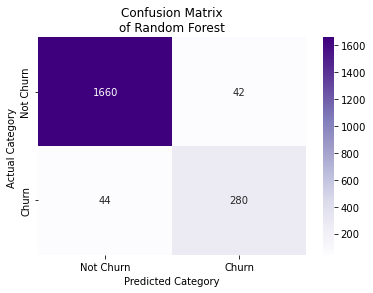

SVC


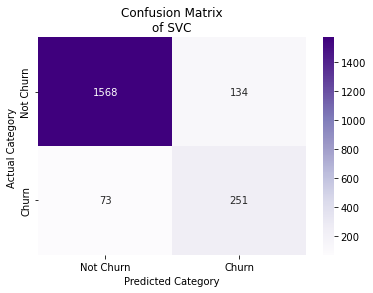

K-Nearest Neighbours


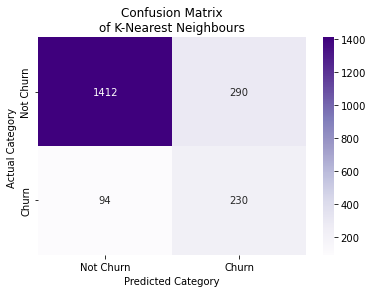

XGBClassifier


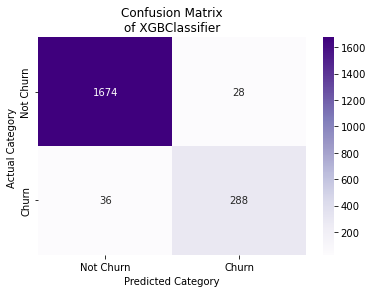

ANN


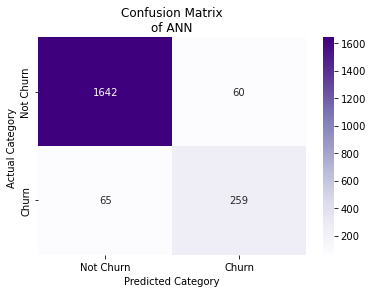

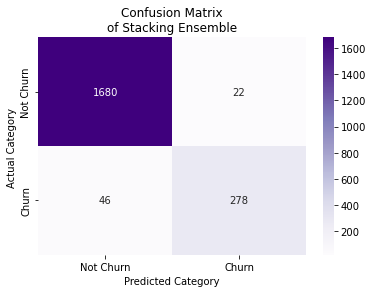

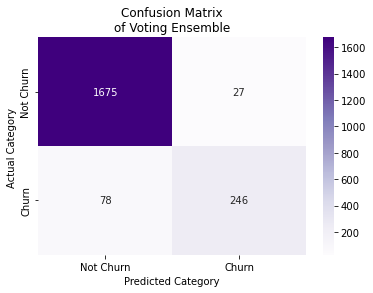

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.957552,0.869565,0.864198,0.866873
1,SVC,0.897828,0.651948,0.774691,0.708039
2,K-Nearest Neighbours,0.810464,0.442308,0.709877,0.545024
3,XGBClassifier,0.968411,0.911392,0.888889,0.900000
4,ANN,0.938302,0.811912,0.799383,0.805599
5,Stacking_estimator,0.966436,0.926667,0.858025,0.891026
6,Voting_estimator,0.948174,0.901099,0.759259,0.824121


Run  2
Distribution Before SMOTE
Counter({0: 4253, 1: 810})

Distribution After SMOTE
Counter({0: 4253, 1: 4253})
Random Forest


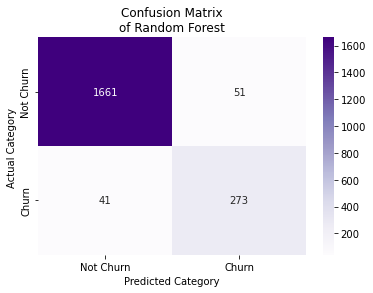

SVC


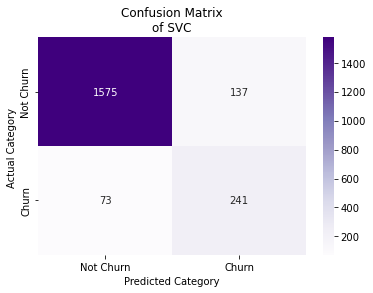

K-Nearest Neighbours


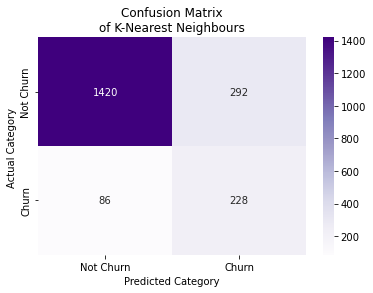

XGBClassifier


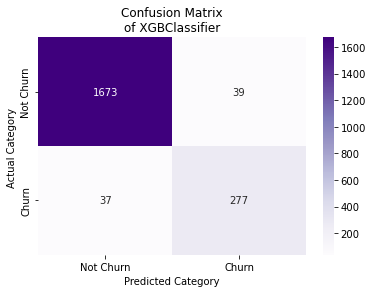

ANN


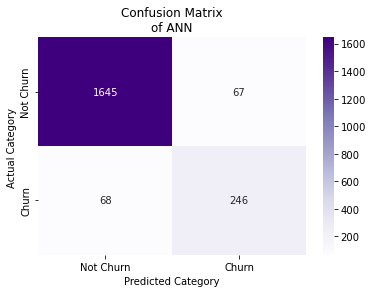

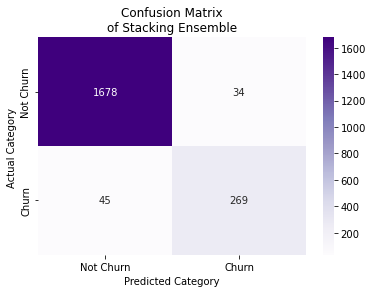

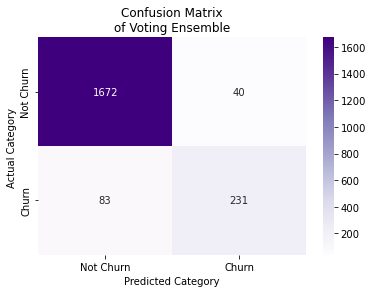

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.954590,0.842593,0.869427,0.855799
1,SVC,0.896347,0.637566,0.767516,0.696532
2,K-Nearest Neighbours,0.813425,0.438462,0.726115,0.546763
3,XGBClassifier,0.962488,0.876582,0.882166,0.879365
4,ANN,0.933366,0.785942,0.783439,0.784689
5,Stacking_estimator,0.961007,0.887789,0.856688,0.871961
6,Voting_estimator,0.939289,0.852399,0.735669,0.789744


Run  3
Distribution Before SMOTE
Counter({0: 4290, 1: 773})

Distribution After SMOTE
Counter({0: 4290, 1: 4290})
Random Forest


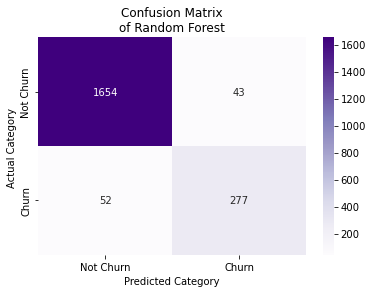

SVC


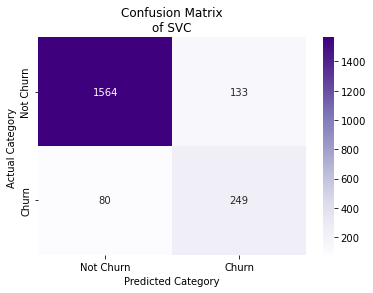

K-Nearest Neighbours


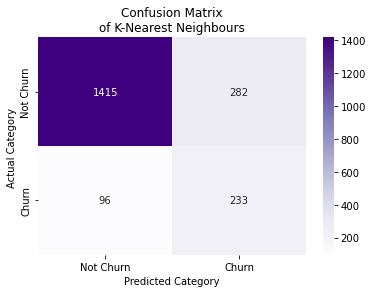

XGBClassifier


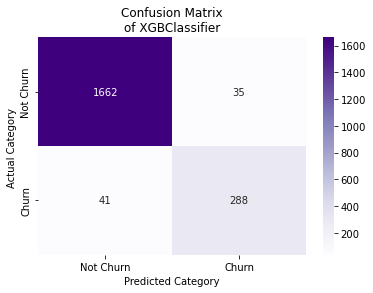

ANN


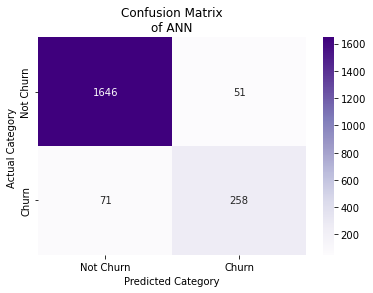

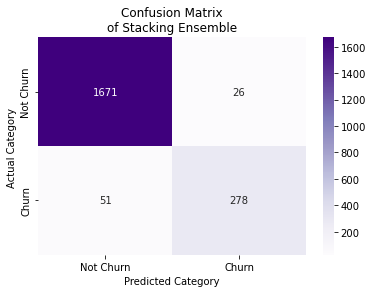

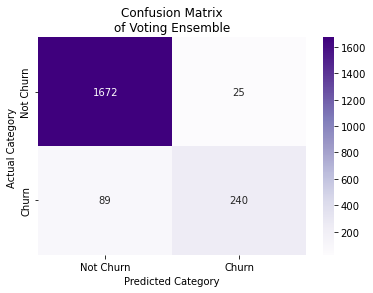

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.953110,0.865625,0.841945,0.853621
1,SVC,0.894867,0.651832,0.756839,0.700422
2,K-Nearest Neighbours,0.813425,0.452427,0.708207,0.552133
3,XGBClassifier,0.962488,0.891641,0.875380,0.883436
4,ANN,0.939783,0.834951,0.784195,0.808777
5,Stacking_estimator,0.961994,0.914474,0.844985,0.878357
6,Voting_estimator,0.943731,0.905660,0.729483,0.808081


Run  4
Distribution Before SMOTE
Counter({0: 4259, 1: 804})

Distribution After SMOTE
Counter({0: 4259, 1: 4259})
Random Forest


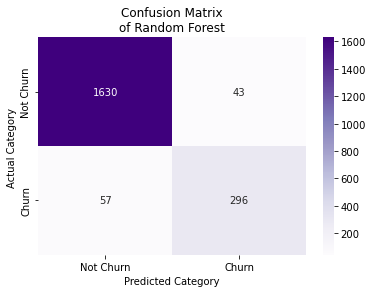

SVC


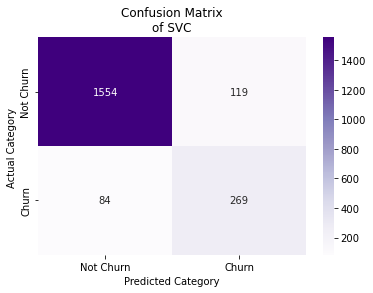

K-Nearest Neighbours


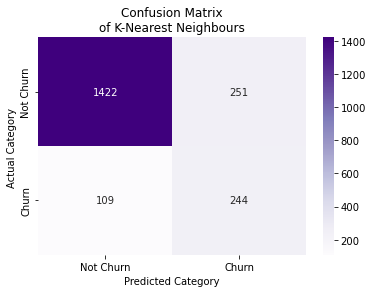

XGBClassifier


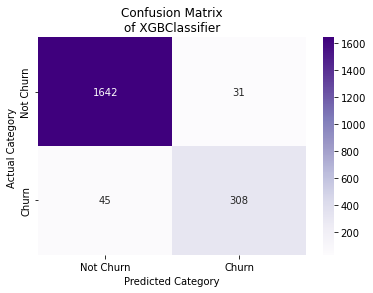

ANN


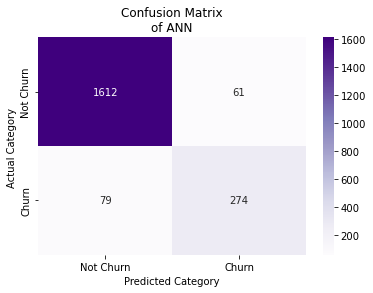

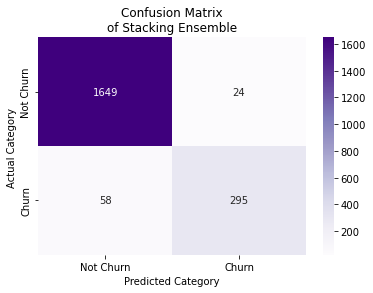

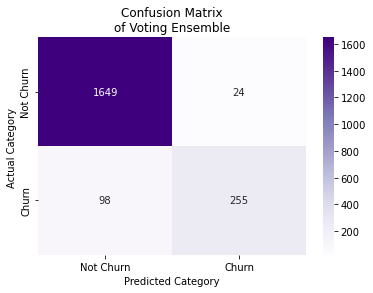

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.950642,0.873156,0.838527,0.855491
1,SVC,0.899803,0.693299,0.762040,0.726046
2,K-Nearest Neighbours,0.822310,0.492929,0.691218,0.575472
3,XGBClassifier,0.962488,0.908555,0.872521,0.890173
4,ANN,0.930898,0.817910,0.776204,0.796512
5,Stacking_estimator,0.959526,0.924765,0.835694,0.877976
6,Voting_estimator,0.939783,0.913978,0.722380,0.806962


Run  5
Distribution Before SMOTE
Counter({0: 4241, 1: 822})

Distribution After SMOTE
Counter({0: 4241, 1: 4241})
Random Forest


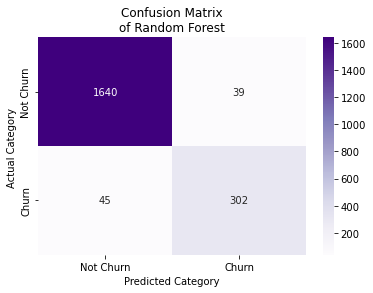

SVC


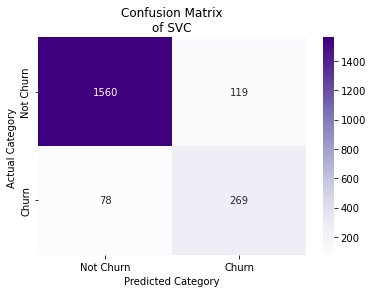

K-Nearest Neighbours


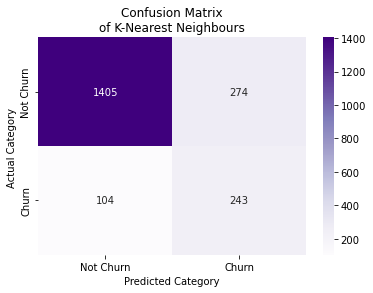

XGBClassifier


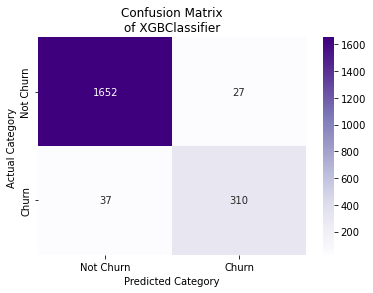

ANN


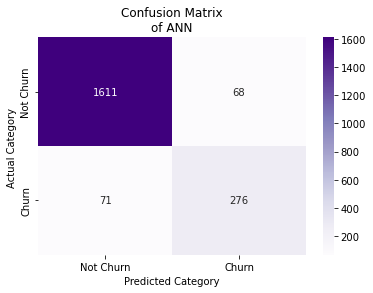

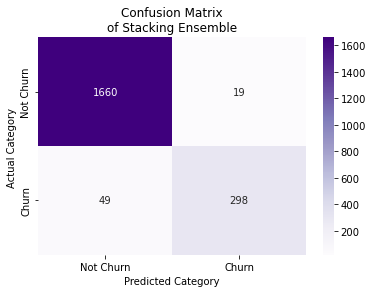

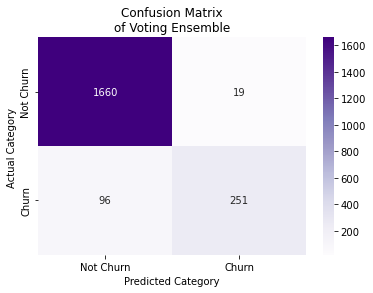

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.958539,0.885630,0.870317,0.877907
1,SVC,0.902764,0.693299,0.775216,0.731973
2,K-Nearest Neighbours,0.813425,0.470019,0.700288,0.562500
3,XGBClassifier,0.968411,0.919881,0.893372,0.906433
4,ANN,0.931392,0.802326,0.795389,0.798842
5,Stacking_estimator,0.966436,0.940063,0.858790,0.897590
6,Voting_estimator,0.943238,0.929630,0.723343,0.813614


Run  6
Distribution Before SMOTE
Counter({0: 4275, 1: 788})

Distribution After SMOTE
Counter({0: 4275, 1: 4275})
Random Forest


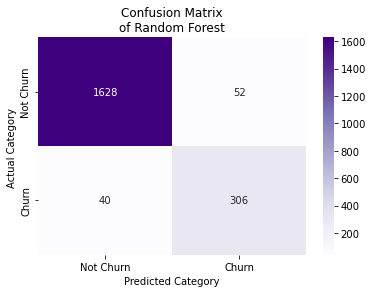

SVC


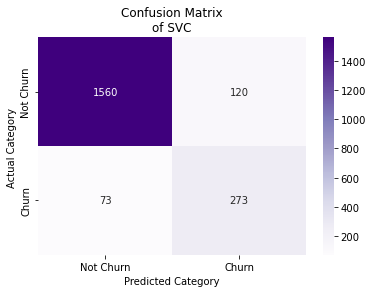

K-Nearest Neighbours


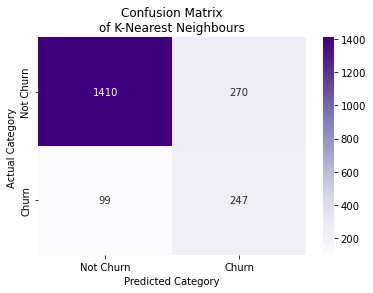

XGBClassifier


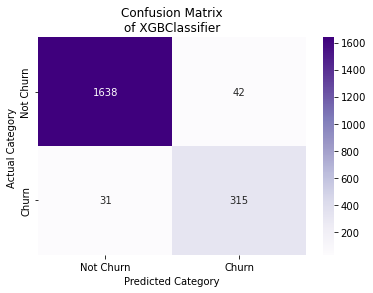

ANN


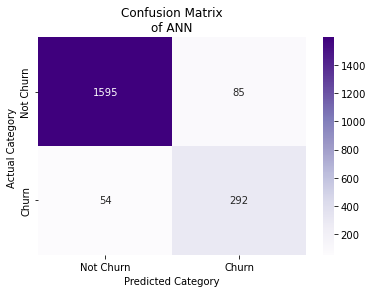

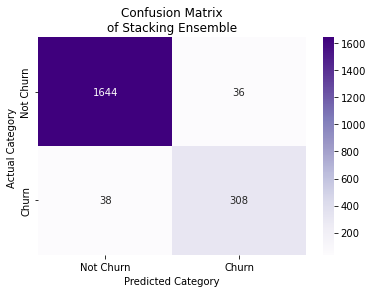

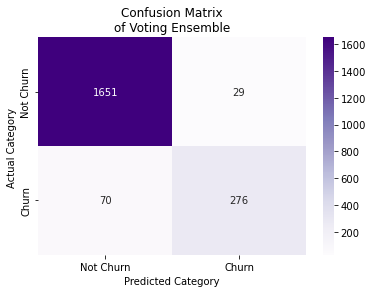

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.954590,0.854749,0.884393,0.869318
1,SVC,0.904738,0.694656,0.789017,0.738836
2,K-Nearest Neighbours,0.817868,0.477756,0.713873,0.572422
3,XGBClassifier,0.963968,0.882353,0.910405,0.896159
4,ANN,0.931392,0.774536,0.843931,0.807746
5,Stacking_estimator,0.963475,0.895349,0.890173,0.892754
6,Voting_estimator,0.951135,0.904918,0.797688,0.847926


Run  7
Distribution Before SMOTE
Counter({0: 4308, 1: 755})

Distribution After SMOTE
Counter({1: 4308, 0: 4308})
Random Forest


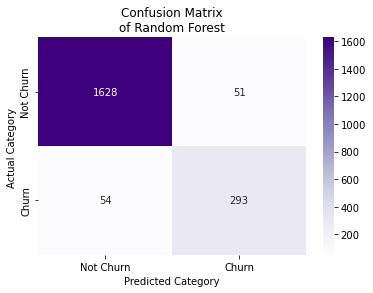

SVC


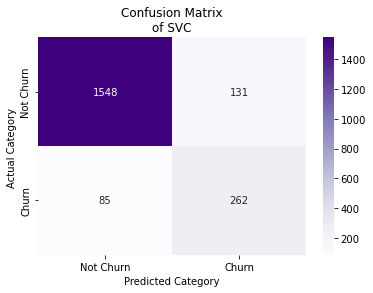

K-Nearest Neighbours


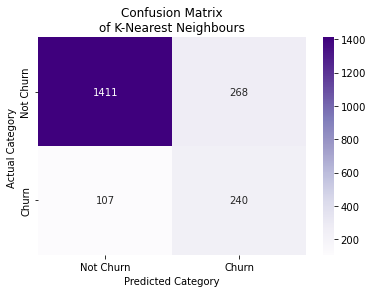

XGBClassifier


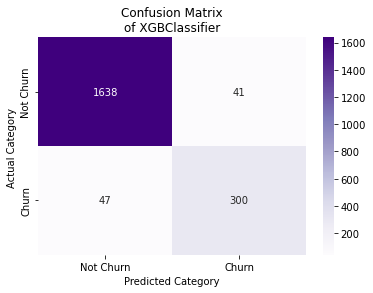

ANN


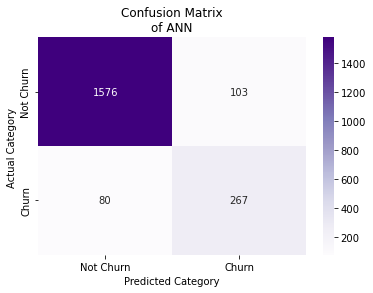

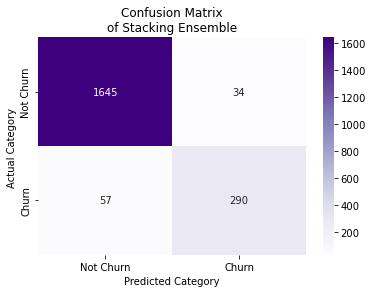

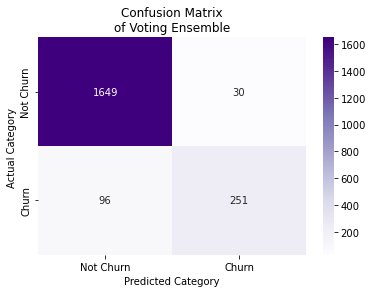

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.948174,0.851744,0.844380,0.848046
1,SVC,0.893386,0.666667,0.755043,0.708108
2,K-Nearest Neighbours,0.814906,0.472441,0.691643,0.561404
3,XGBClassifier,0.956565,0.879765,0.864553,0.872093
4,ANN,0.909674,0.721622,0.769452,0.744770
5,Stacking_estimator,0.955084,0.895062,0.835735,0.864382
6,Voting_estimator,0.937808,0.893238,0.723343,0.799363


Run  8
Distribution Before SMOTE
Counter({0: 4260, 1: 803})

Distribution After SMOTE
Counter({0: 4260, 1: 4260})
Random Forest


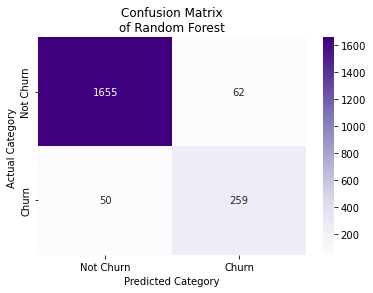

SVC


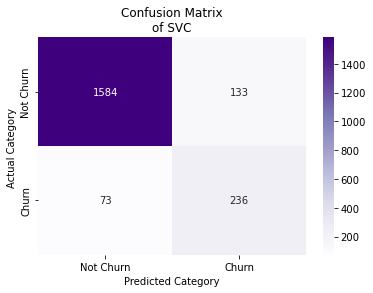

K-Nearest Neighbours


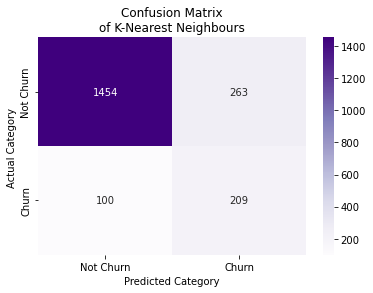

XGBClassifier


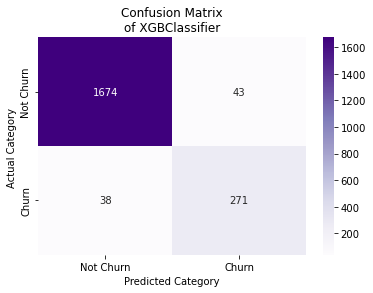

ANN


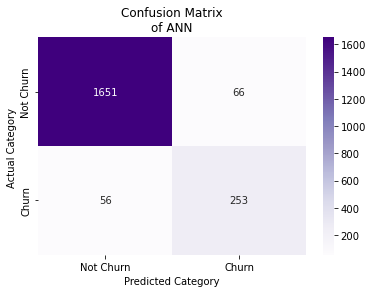

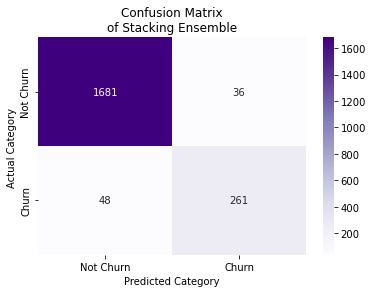

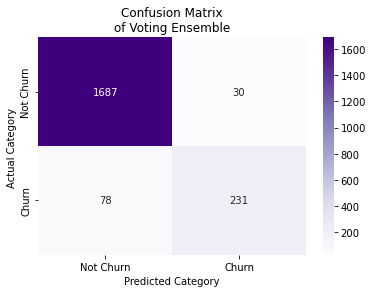

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.944719,0.806854,0.838188,0.822222
1,SVC,0.898322,0.639566,0.763754,0.696165
2,K-Nearest Neighbours,0.820829,0.442797,0.676375,0.535211
3,XGBClassifier,0.960020,0.863057,0.877023,0.869984
4,ANN,0.939783,0.793103,0.818770,0.805732
5,Stacking_estimator,0.958539,0.878788,0.844660,0.861386
6,Voting_estimator,0.946693,0.885057,0.747573,0.810526


Run  9
Distribution Before SMOTE
Counter({0: 4265, 1: 798})

Distribution After SMOTE
Counter({0: 4265, 1: 4265})
Random Forest


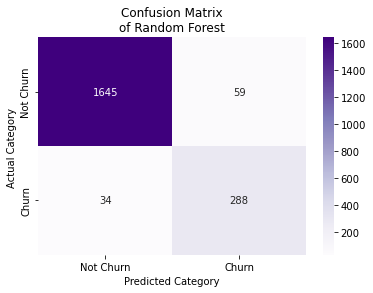

SVC


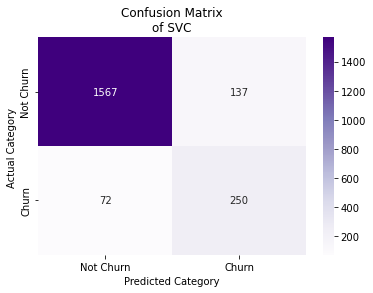

K-Nearest Neighbours


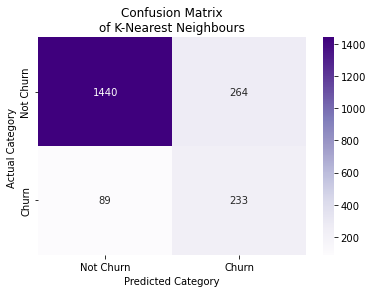

XGBClassifier


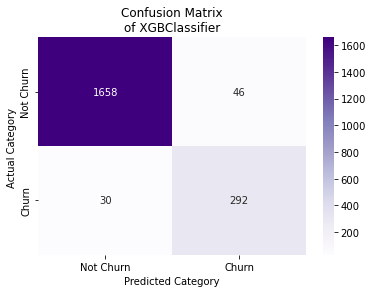

ANN


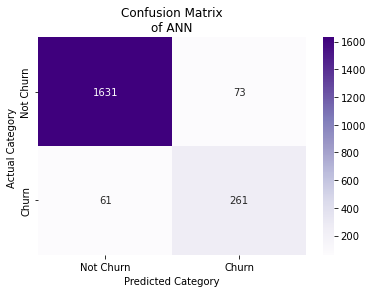

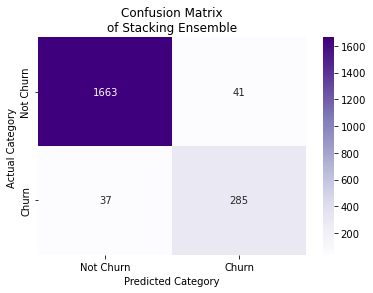

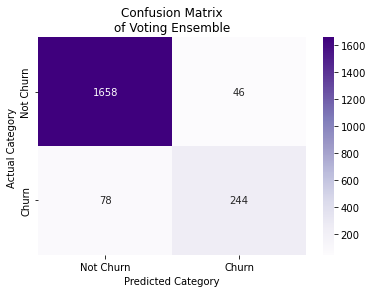

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.954097,0.829971,0.894410,0.860987
1,SVC,0.896841,0.645995,0.776398,0.705219
2,K-Nearest Neighbours,0.825765,0.468813,0.723602,0.568987
3,XGBClassifier,0.962488,0.863905,0.906832,0.884848
4,ANN,0.933860,0.781437,0.810559,0.795732
5,Stacking_estimator,0.961500,0.874233,0.885093,0.879630
6,Voting_estimator,0.938796,0.841379,0.757764,0.797386


Run  10
Distribution Before SMOTE
Counter({0: 4245, 1: 818})

Distribution After SMOTE
Counter({0: 4245, 1: 4245})
Random Forest


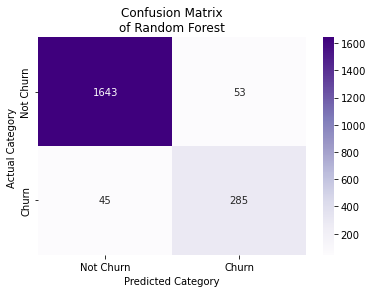

SVC


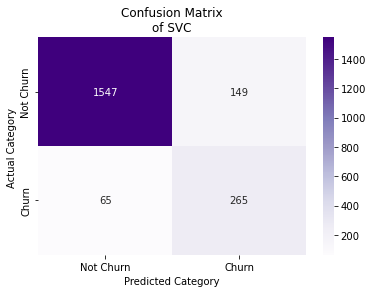

K-Nearest Neighbours


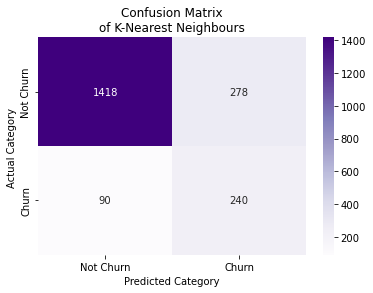

XGBClassifier


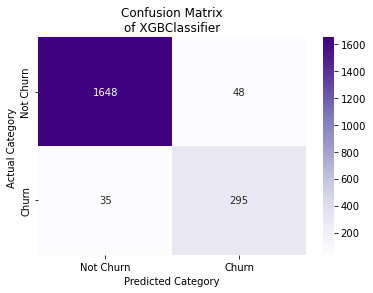

ANN


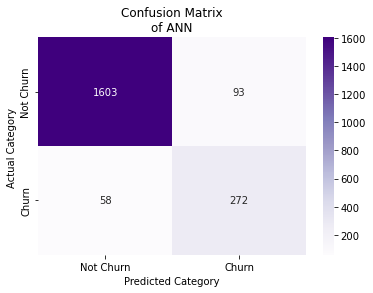

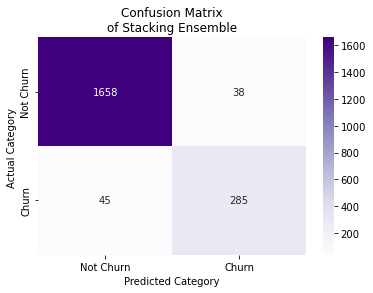

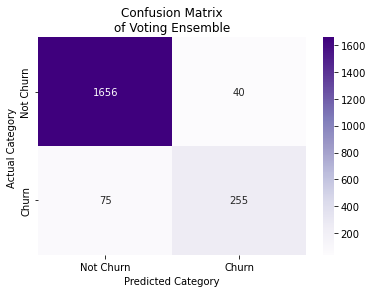

,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.951629,0.843195,0.863636,0.853293
1,SVC,0.894373,0.640097,0.803030,0.712366
2,K-Nearest Neighbours,0.818361,0.463320,0.727273,0.566038
3,XGBClassifier,0.959033,0.860058,0.893939,0.876672
4,ANN,0.925469,0.745205,0.824242,0.782734
5,Stacking_estimator,0.959033,0.882353,0.863636,0.872894
6,Voting_estimator,0.943238,0.864407,0.772727,0.816000


In [105]:
performance_final = pd.DataFrame([])
X = Churn_Dataset.drop(["attrition_flag"],axis=1)
y = Churn_Dataset["attrition_flag"]
num_of_run = 10
for i in range(num_of_run):
    print("Run ",i+1)
    classifiers = {"Random Forest":RandomForestClassifier(random_state=0,max_depth=100,n_estimators=1000), 
                   "SVC":SVC(probability=True), 
                   "K-Nearest Neighbours": KNeighborsClassifier(n_neighbors=3),
                   "XGBClassifier": XGBClassifier(eval_metric="logloss",use_label_encoder=False), 
                   "ANN": ANN_model()}

    df_ensemble_train, df_ensemble_test, df_performance = runCustomEnsemble(X,y,classifiers)
    performance_final = pd.concat([performance_final,df_performance])


In [180]:
df_ensemble_test.head(10)

,label,Random Forest,SVC,K-Nearest Neighbours,XGBClassifier,ANN
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,0,0,1,0,0,1
3,0,0,0,0,0,0
4,1,1,0,0,1,1
5,0,0,0,1,0,0
6,0,0,0,1,0,0
7,0,0,0,1,0,0
8,0,0,0,0,0,0
9,0,0,0,0,0,0


##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 5.2 Results

By applying SMOTE balancing technique on the training dataset, we were able to increase the recall score significantly. 

On average, XGBoost had the highest accuracy of 96.26%, followed by the Stacking Ensemble with an accuracy of 96.13%. Since the dataset is highly imbalanced, accuracy could be a misleading metric for evaluating the model. 

Recall and Precision are more relevant evaluation metric for this analysis. The Stacking Ensemble method consistency had the highest precision with values reaching 94% over the 10 iterations. While XGBoost consistently gave a higher recall values with a maximum value of 91%.

In [107]:
performance_final.groupby(["Model"]).mean()#.sort_values(by=['Precision'])

,Accuracy,Precision,Recall,F1 Score
Model,,,,
ANN,0.931392,0.786895,0.800556,0.793113
K-Nearest Neighbours,0.817078,0.462127,0.706847,0.558595
Random Forest,0.952764,0.852308,0.860942,0.856356
SVC,0.897927,0.661493,0.772354,0.712371
Stacking_estimator,0.961303,0.901954,0.857348,0.878796
Voting_estimator,0.943189,0.889177,0.746923,0.811372
XGBClassifier,0.962636,0.885719,0.886508,0.885916


In [109]:
performance_final.groupby(["Model"]).max()#.sort_values(by=['Precision'])

,Accuracy,Precision,Recall,F1 Score
Model,,,,
ANN,0.939783,0.834951,0.843931,0.808777
K-Nearest Neighbours,0.825765,0.492929,0.727273,0.575472
Random Forest,0.958539,0.885630,0.894410,0.877907
SVC,0.904738,0.694656,0.803030,0.738836
Stacking_estimator,0.966436,0.940063,0.890173,0.897590
Voting_estimator,0.951135,0.929630,0.797688,0.847926
XGBClassifier,0.968411,0.919881,0.910405,0.906433


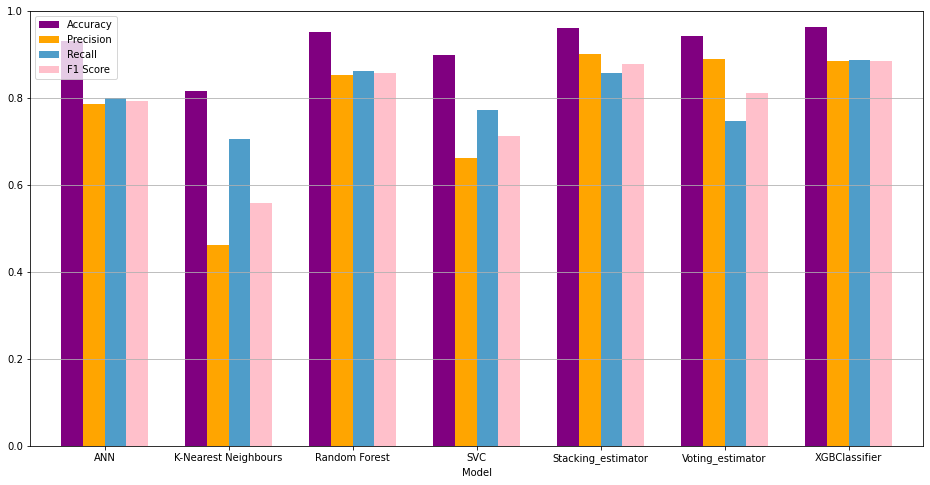

In [157]:
performance_final_group = performance_final.groupby(["Model"]).mean()#.sort_values(by=['Precision'])
performance_final_group.plot.bar(rot = 0,color=["purple","orange","#4f9dc9","pink"], width=0.7)
plt.rcParams['figure.figsize'] = [16, 8]
plt.ylim(0, 1)
plt.grid(axis = 'y')
plt.legend(loc=2)
plt.show()

In [118]:
performance_final.to_csv("Performance_SMOTE.csv")

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 5.3 Feature Importance

In order for credit card companies to have a better understanding of their customer base, feature Importance is determined using XGBoost and confirmed using Random Forest. Evaluating which attributes are more relevant in predicting churn is important for service provider, as it helps improve customer retention.

We find that behavioural and interactive attributes are more relevant in predicting if a credit card customer will churn rather than demographic attributes such as income category, education level, dependent count and marital status.

In [132]:
from xgboost import plot_importance
from sklearn.model_selection import train_test_split

models={"XGB":XGBClassifier(random_state = 2,use_label_encoder=False,eval_metric="logloss"),
        "RF":RandomForestClassifier()}

X = Churn_Dataset.drop(["attrition_flag"],axis=1)
y = Churn_Dataset["attrition_flag"]

output_df = {"Feature": list(X.columns)}

for key in models:
    # Split the data into a training set and a test set
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state =1)

    oversample = SMOTE()
    X_train, y_train = oversample.fit_resample(X_train, y_train)

    model = models[key]
    # Training the model
    model.fit(X_train, y_train)

    # Computing the importance of each feature
    model_feature_importance = model.feature_importances_
    
    # Normalize model importance
    norm_importance = (model_feature_importance - 
                       np.min(model_feature_importance))/(np.max(model_feature_importance) - 
                                                                  np.min(model_feature_importance))  
    

    output_df[key] = list(norm_importance.round(3))

output_df = pd.DataFrame.from_dict(output_df).sort_values(by=['XGB'],ascending =False).set_index('Feature')
output_df.index.name = ''
print(output_df)

                            XGB     RF
                                      
total_trans_count         1.000  0.934
total_relationship_count  0.302  0.255
total_revolving_bal       0.295  0.496
total_trans_amt           0.210  1.000
gender                    0.163  0.088
total_count_change_q4_q1  0.140  0.498
income_category           0.082  0.041
total_amt_change_q4_q1    0.066  0.227
customer_age              0.063  0.105
avg_open_to_buy           0.061  0.127
months_inactive_12_month  0.053  0.062
credit_limit              0.034  0.116
avg_utilization_ratio     0.028  0.258
contacts_count_12_month   0.025  0.052
card_category             0.023  0.000
marital_status            0.018  0.015
education_level           0.007  0.032
months_on_book            0.001  0.062
dependent_count           0.000  0.025


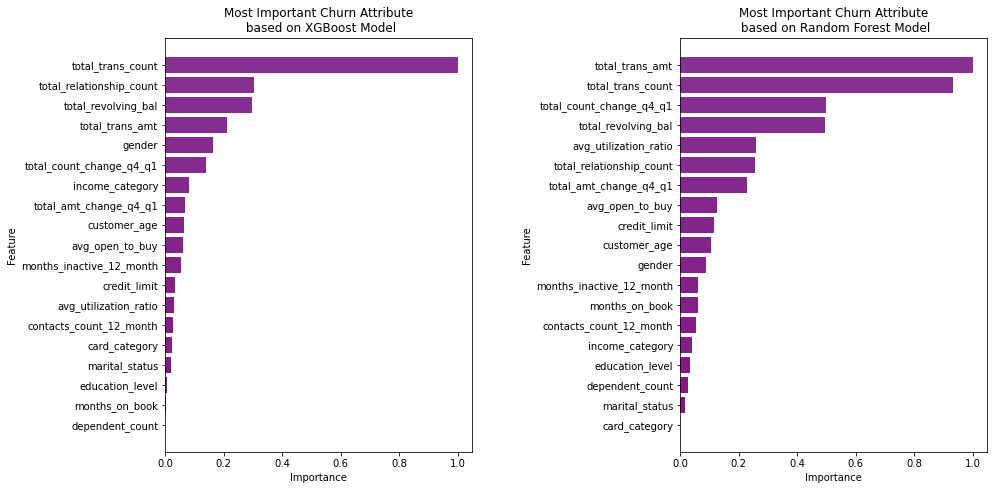

In [150]:
fig, axs = plt.subplots(1,2, figsize=(15,8))

cmap = plt.get_cmap("BuPu")(np.flip(np.arange(220)))

output_df = output_df.sort_values(by="XGB",ascending =True)
axs[0].barh(output_df.index,output_df["XGB"],color=cmap)
axs[0].set_title('Most Important Churn Attribute\n based on XGBoost Model')
axs[0].set(ylabel='Feature')
axs[0].set(xlabel='Importance')

output_df = output_df.sort_values(by="RF",ascending =True)
axs[1].barh(output_df.index,output_df["RF"],color=cmap)
axs[1].set_title('Most Important Churn Attribute\n based on Random Forest Model')
axs[1].set(ylabel='Feature')
axs[1].set(xlabel='Importance')

fig.tight_layout(pad=5.0)
plt.show()



##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

# 6. Random Sampling Balancing Technique

## 6.1 Modelling using Random Forest, SVM, KNN, ANN, Logistic Regression and Ensembles (Stacking & Voting)

In [181]:
def split_data_rs(): 
    Existing_Class = Churn_Dataset[Churn_Dataset["attrition_flag"] ==0]
    Attrited_Class = Churn_Dataset[Churn_Dataset["attrition_flag"] ==1]

    Existing_Class = Existing_Class.sample(frac=1).reset_index(drop=True)
    Attrited_Class = Attrited_Class.sample(frac=1).reset_index(drop=True)

    X_train_E = Existing_Class.iloc[:750]
    X_train_A = Attrited_Class.iloc[:250]

    X_val_E = Existing_Class.iloc[750:1500]
    X_val_A = Attrited_Class.iloc[250:500]

    X_test_E = Existing_Class.iloc[1500:]
    X_test_A = Attrited_Class.iloc[500:]

    X_train = pd.concat([X_train_E, X_train_A])
    X_val = pd.concat([X_val_E, X_val_A])
    X_test = pd.concat([X_test_E, X_test_A])

    X_train = X_train.sample(frac=1).reset_index(drop=True)
    X_val = X_val.sample(frac=1).reset_index(drop=True)
    X_test = X_test.sample(frac=1).reset_index(drop=True)

    y_train = X_train["attrition_flag"]
    y_val = X_val["attrition_flag"]
    y_test = X_test["attrition_flag"]


    drop_col = ["attrition_flag"]
    X_train = X_train.drop(drop_col,axis=1)
    X_val = X_val.drop(drop_col,axis=1)
    X_test = X_test.drop(drop_col,axis=1)

    #print(X_train.shape)
    #print(X_val.shape)
    #print(X_test.shape)
    #print(y_train.shape)
    #print(y_val.shape)
    #print(y_test.shape)
    
    return X_train, y_train, X_val, y_val, X_test, y_test

In [182]:
from sklearn.linear_model import Lasso
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
def runCustomEnsembleRandomSample(X_train, y_train, X_val, y_val, X_test, y_test, dic_models):
    df_vote = pd.DataFrame([])
    
    #print(len(X_train),len(X_val),len(X_test))
    
    # Applying normalization to data
    X_train, X_val, X_test = data_normalization(X_train, X_val, X_test)
    
    df_ensemble_train = pd.DataFrame([])
    df_ensemble_train["label"] = y_val
    
    df_ensemble_test = pd.DataFrame([])
    df_ensemble_test["label"] = y_test
    
    df_performance = pd.DataFrame(columns=["Model","Accuracy","Precision","Recall", "F1 Score"])

    
    for key in dic_models:
        row={}
        model = dic_models[key]
        if key != "ANN":
            model.fit(X_train, y_train)
            pred1 = model.predict(X_val)
            df_ensemble_train[key] = pred1
            pred2 = model.predict(X_test)
            df_ensemble_test[key] = pred2
        else:
            X_train = np.asarray(X_train)
            X_val = np.asarray(X_val)
            X_test = np.asarray(X_test)
            
            y_train = np.asarray(y_train)
            y_val = np.asarray(y_val)
            y_test = np.asarray(y_test)
            
            model.fit(X_train,
                      y_train,
                      batch_size=128,
                      epochs=50,
                      validation_split=0.2, 
                      verbose=0)
            pred1 = model.predict_classes(X_val)
            df_ensemble_train[key] = pred1
            pred2 = model.predict_classes(X_test)
            df_ensemble_test[key] = pred2
        
        Model_Accuracy = accuracy_score(y_test, pred2)
        Model_Precision = precision_score(y_test, pred2) 
        Model_Recall = recall_score(y_test, pred2)      
        Model_f1_score = f1_score(y_test, pred2) 
        
        print(key+ " Model Complete")
        row["Model"]= key
        row['Accuracy'] = Model_Accuracy
        row['Precision'] = Model_Precision
        row["Recall"] = Model_Recall
        row["F1 Score"] = Model_f1_score

        df_performance = df_performance.append(row,ignore_index=True)      


    X = df_ensemble_train.drop("label", axis=1)
    y = df_ensemble_train["label"]
    
    #For voting estimator, prediction is based on results on test
    X_test = df_ensemble_test.drop("label", axis=1)
    y_test = df_ensemble_test["label"]
    
    model = LogisticRegression()
    model.fit(X, y)
    pred = model.predict(X_test)

    Model_Accuracy = accuracy_score(y_test, pred)
    Model_Precision = precision_score(y_test, pred) 
    Model_Recall = recall_score(y_test, pred)      
    Model_f1_score = f1_score(y_test, pred) 
    
    row={}
    row["Model"]= "Stacking_estimator"
    row['Accuracy'] = Model_Accuracy
    row['Precision'] = Model_Precision
    row["Recall"] = Model_Recall
    row["F1 Score"] = Model_f1_score
    df_performance = df_performance.append(row,ignore_index=True)
    
    df_vote = X_test.copy()
    df_vote["vote"] = df_vote.sum(axis=1)
    df_vote["Voting_estimator"] = 0
    df_vote.loc[(df_vote["vote"] >=4), "Voting_estimator"] = 1
    pred = df_vote["Voting_estimator"]
    
    Model_Accuracy = accuracy_score(y_test, pred)
    Model_Precision = precision_score(y_test, pred) 
    Model_Recall = recall_score(y_test, pred)      
    Model_f1_score = f1_score(y_test, pred) 
    
    row={}
    row["Model"]= "Voting_estimator"
    row['Accuracy'] = Model_Accuracy
    row['Precision'] = Model_Precision
    row["Recall"] = Model_Recall
    row["F1 Score"] = Model_f1_score
    df_performance = df_performance.append(row,ignore_index=True)
    
    display(df_performance)
    
    return df_ensemble_train, df_ensemble_test, df_performance

In [183]:
performance_final = pd.DataFrame([])
num_of_run = 10
for i in range(num_of_run):
    print("Run ",i+1)

    X_train, y_train, X_val, y_val, X_test, y_test = split_data_rs()
    classifiers = {"Random Forest":RandomForestClassifier(random_state=0,max_depth=100,n_estimators=1000), 
                   "SVC":SVC(probability=True), 
                   "K-Nearest Neighbours": KNeighborsClassifier(n_neighbors=2),
                   "XGBClassifier": XGBClassifier(eval_metric="logloss",use_label_encoder=False), 
                   "ANN": ANN_model()
                  }

    df_ensemble_train, df_ensemble_test, df_performance = runCustomEnsembleRandomSample(X_train,
                                                                                        y_train,
                                                                                        X_val, 
                                                                                        y_val,
                                                                                        X_test,
                                                                                        y_test,
                                                                                        classifiers)
    performance_final = pd.concat([performance_final,df_performance])

Run  1
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.950781,0.857424,0.773736,0.813433
1,SVC,0.918051,0.777377,0.573203,0.659857
2,K-Nearest Neighbours,0.883352,0.641390,0.360248,0.461364
3,XGBClassifier,0.957918,0.847038,0.850044,0.848539
4,ANN,0.907715,0.712514,0.560781,0.627607
5,Stacking_estimator,0.954227,0.867575,0.790594,0.827298
6,Voting_estimator,0.924080,0.911290,0.501331,0.646823


Run  2
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.949551,0.854599,0.766637,0.808232
1,SVC,0.911160,0.725250,0.578527,0.643633
2,K-Nearest Neighbours,0.875846,0.590769,0.340728,0.432189
3,XGBClassifier,0.958779,0.844348,0.861579,0.852877
4,ANN,0.903654,0.654955,0.645075,0.649978
5,Stacking_estimator,0.957180,0.828138,0.872227,0.849611
6,Voting_estimator,0.928633,0.902798,0.543922,0.678848


Run  3
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.945613,0.811081,0.792369,0.801616
1,SVC,0.909807,0.707368,0.596273,0.647087
2,K-Nearest Neighbours,0.878799,0.612342,0.343390,0.440023
3,XGBClassifier,0.952012,0.809924,0.854481,0.831606
4,ANN,0.907838,0.669355,0.662822,0.666072
5,Stacking_estimator,0.949674,0.793781,0.860692,0.825883
6,Voting_estimator,0.926295,0.857724,0.561668,0.678820


Run  4
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.940938,0.765818,0.826974,0.795222
1,SVC,0.913375,0.701621,0.653061,0.676471
2,K-Nearest Neighbours,0.886059,0.631717,0.427684,0.510053
3,XGBClassifier,0.954842,0.809446,0.881988,0.844161
4,ANN,0.894795,0.610749,0.665484,0.636943
5,Stacking_estimator,0.955088,0.810767,0.881988,0.844879
6,Voting_estimator,0.930233,0.850877,0.602484,0.705455


Run  5
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.948567,0.862845,0.748004,0.801331
1,SVC,0.916451,0.766033,0.572316,0.655155
2,K-Nearest Neighbours,0.876215,0.589365,0.354037,0.442350
3,XGBClassifier,0.960133,0.876995,0.828749,0.852190
4,ANN,0.902424,0.648313,0.647737,0.648025
5,Stacking_estimator,0.958410,0.860933,0.834960,0.847748
6,Voting_estimator,0.927156,0.899851,0.534161,0.670379


Run  6
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.950412,0.853516,0.775510,0.812645
1,SVC,0.913375,0.734739,0.587400,0.652860
2,K-Nearest Neighbours,0.883229,0.656690,0.330967,0.440118
3,XGBClassifier,0.960625,0.856764,0.859805,0.858282
4,ANN,0.902424,0.658745,0.614907,0.636072
5,Stacking_estimator,0.959395,0.846221,0.864241,0.855136
6,Voting_estimator,0.926295,0.891691,0.533274,0.667407


Run  7
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.947828,0.830668,0.783496,0.806393
1,SVC,0.917436,0.750000,0.606921,0.670917
2,K-Nearest Neighbours,0.879537,0.630742,0.316770,0.421737
3,XGBClassifier,0.953858,0.818105,0.858030,0.837592
4,ANN,0.904885,0.667297,0.626442,0.646224
5,Stacking_estimator,0.953858,0.818105,0.858030,0.837592
6,Voting_estimator,0.926295,0.877143,0.544809,0.672140


Run  8
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.950658,0.835490,0.802130,0.818470
1,SVC,0.915713,0.723684,0.634428,0.676123
2,K-Nearest Neighbours,0.873262,0.574961,0.330080,0.419391
3,XGBClassifier,0.961117,0.854768,0.866903,0.860793
4,ANN,0.890981,0.592055,0.687666,0.636289
5,Stacking_estimator,0.960994,0.854021,0.866903,0.860414
6,Voting_estimator,0.933186,0.905556,0.578527,0.706010


Run  9
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.944629,0.827686,0.758651,0.791667
1,SVC,0.911283,0.719222,0.590949,0.648807
2,K-Nearest Neighbours,0.887166,0.667197,0.371783,0.477493
3,XGBClassifier,0.957057,0.861524,0.822538,0.841580
4,ANN,0.896395,0.637681,0.585626,0.610546
5,Stacking_estimator,0.957057,0.861524,0.822538,0.841580
6,Voting_estimator,0.925680,0.888559,0.530612,0.664444


Run  10
Random Forest Model Complete
SVC Model Complete
K-Nearest Neighbours Model Complete
XGBClassifier Model Complete
ANN Model Complete


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.951397,0.813894,0.842059,0.827737
1,SVC,0.913129,0.732597,0.588287,0.652559
2,K-Nearest Neighbours,0.872401,0.569444,0.327418,0.415775
3,XGBClassifier,0.955703,0.815119,0.880213,0.846416
4,ANN,0.900947,0.626772,0.706300,0.664164
5,Stacking_estimator,0.952012,0.792228,0.886424,0.836683
6,Voting_estimator,0.930971,0.881402,0.580302,0.699839


##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 6.2 Results

A similar experimentation is carried out on the random sampled dataset. Again, XGBoost and Stacking Ensemble perform best at predicting customer churn. However, we see that there is no significant improvement compared to the SMOTE dataset

In [265]:
performance_final.groupby(["Model"]).mean().sort_values(by=['Precision'])

,Accuracy,Precision,Recall,F1 Score
Model,,,,
ANN,0.893811,0.621590,0.665040,0.635535
K-Nearest Neighbours,0.883844,0.639318,0.372671,0.470859
SVC,0.911899,0.704051,0.631766,0.665289
XGBClassifier,0.955026,0.817450,0.870009,0.842900
Random Forest,0.949612,0.831998,0.797693,0.814475
Stacking_estimator,0.952012,0.839077,0.809228,0.823843
Voting_estimator,0.929802,0.871116,0.579414,0.695560


In [266]:
performance_final.groupby(["Model"]).std().sort_values(by=['Precision'])

,Accuracy,Precision,Recall,F1 Score
Model,,,,
Voting_estimator,0.005307,0.003916,0.041410,0.031131
Random Forest,0.002175,0.004921,0.012548,0.008899
XGBClassifier,0.000609,0.005245,0.003137,0.001316
Stacking_estimator,0.000174,0.007268,0.008784,0.001049
K-Nearest Neighbours,0.001218,0.009033,0.001255,0.003452
SVC,0.002088,0.026608,0.032626,0.006226
ANN,0.019664,0.100343,0.089722,0.011793


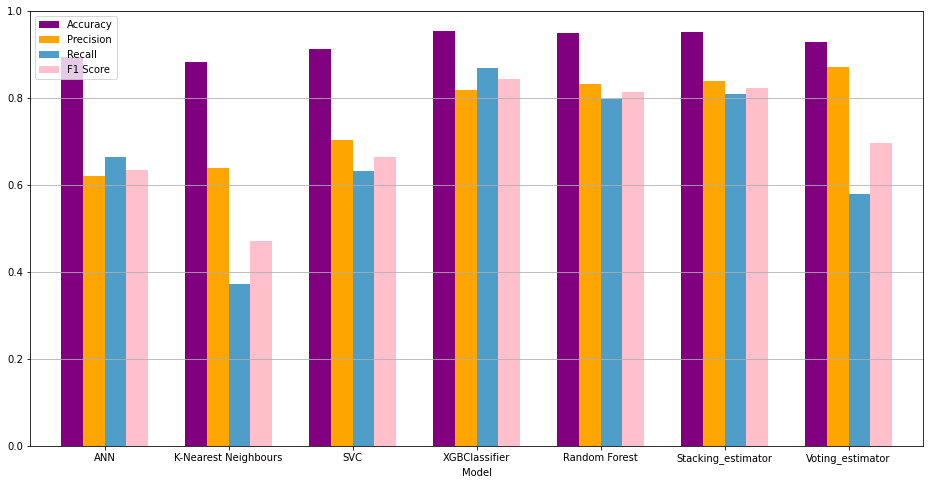

In [267]:
performance_final_group = performance_final.groupby(["Model"]).mean().sort_values(by=['Precision'])
performance_final_group.plot.bar(rot = 0,color=["purple","orange","#4f9dc9","pink"], width=0.7)
plt.rcParams['figure.figsize'] = [16, 8]
plt.ylim(0, 1)
plt.grid(axis = 'y')
plt.legend(loc=2)
plt.show()

In [ ]:
performance_final.to_csv("Performance_RS.csv")

##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

## 6.3 Feature Importance
Feature Importance is also determined using Random Sampling

In [270]:
from xgboost import plot_importance
from sklearn.model_selection import train_test_split

models={"XGB":XGBClassifier(random_state = 2,use_label_encoder=False,eval_metric="logloss"),
        "RF":RandomForestClassifier()}

output_df = {"Feature": list(X.columns)}

for key in models:
    # Split the data into a training set and a test set
    X_train, y_train, X_val, y_val, X_test, y_test = split_data_rs()

    model = models[key]
    # Training the model
    model.fit(X_train, y_train)

    # Computing the importance of each feature
    model_feature_importance = model.feature_importances_
    
    # Normalize model importance
    norm_importance = (model_feature_importance - 
                       np.min(model_feature_importance))/(np.max(model_feature_importance) - 
                                                                  np.min(model_feature_importance))  
    

    output_df[key] = list(norm_importance.round(3))

output_df = pd.DataFrame.from_dict(output_df).sort_values(by=['XGB'],ascending =False).set_index('Feature')
output_df.index.name = ''
print(output_df)

                            XGB     RF
                                      
total_trans_count         1.000  1.000
total_revolving_bal       0.821  0.504
total_relationship_count  0.699  0.286
total_trans_amt           0.377  0.877
total_count_change_q4_q1  0.336  0.816
customer_age              0.251  0.112
total_amt_change_q4_q1    0.226  0.274
gender                    0.212  0.023
avg_utilization_ratio     0.208  0.334
dependent_count           0.157  0.038
months_inactive_12_month  0.144  0.118
marital_status            0.132  0.044
education_level           0.105  0.065
credit_limit              0.104  0.202
months_on_book            0.087  0.114
contacts_count_12_month   0.084  0.123
income_category           0.052  0.045
card_category             0.000  0.000


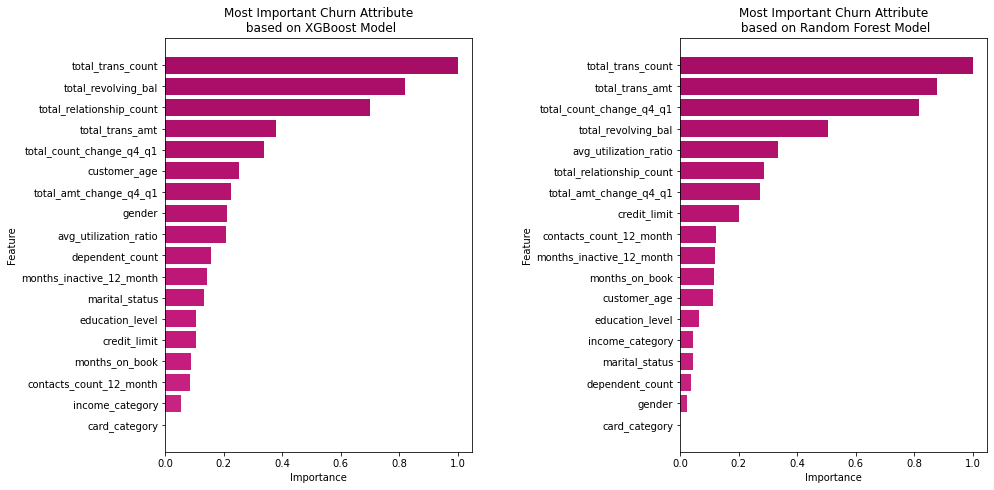

In [271]:
fig, axs = plt.subplots(1,2, figsize=(15,8))

cmap = plt.get_cmap("BuPu")(np.flip(np.arange(220)))

output_df = output_df.sort_values(by="XGB",ascending =True)
axs[0].barh(output_df.index,output_df["XGB"],color=cmap)
axs[0].set_title('Most Important Churn Attribute\n based on XGBoost Model')
axs[0].set(ylabel='Feature')
axs[0].set(xlabel='Importance')

output_df = output_df.sort_values(by="RF",ascending =True)
axs[1].barh(output_df.index,output_df["RF"],color=cmap)
axs[1].set_title('Most Important Churn Attribute\n based on Random Forest Model')
axs[1].set(ylabel='Feature')
axs[1].set(xlabel='Importance')

fig.tight_layout(pad=5.0)
plt.show()



##### [Back to Top](#A-Predictive-Analysis-on-Credit-Card-Customer-Churn-Using-Maching-Learning-and-Deep-Learning-Techniques)

# 7. Conclusion

We were able to significantly improve the recall score by applying SMOTE balancing technique to the training data and making predictions on the raw data. Overall, XGBoost classifier and Stacking Ensemble outperformed all other models. After 10 iterations, XGBoost classifier achieved an average accuracy of 96.26%, precision of 88.57%, recall of 88.65% and f1-score of 88.59%. The Stacking Ensemble model performed competitively with an accuracy of 96.13%, precision of 90.20%,  recall of 85.73% and f1-score of 87.88% on average. Although the Voting Ensemble showed high precision values of up to 92.96%, the recall values were relatively low and therefore is would be a suitable model to utilize. Compared to the SMOTE dataset, the randomly sampled dataset showed no improvements.

Over the 10 iterations, we observed a trade-off between precision and recall for the XGBoost and the Stacking Ensemble model. XGBoost consistently achieved the highest recall score while Stacking Ensemble performed best in terms of precision. When deciding which model to use, the credit card company should consider its goals as well cost of the marketing strategy. XGBoost model has the ability to correctly capture more of the churning customers than the Stacking Ensemble. However, if the marketing campaign is more costly and if the company is only interested in capturing a portion of the churning customer, they could consider utilizing the Stacking ensemble model as the model is able to achieve a higher precision and predict less false positives than the XGBoost model.

On evaluating the features importance, we saw that behavioural and interactive attributes are more relevant in predicting if a credit card customer will churn rather than demographic attributes such as income category, education level, dependent count and marital status.